# imports

In [1]:
import json
import shutil
from PIL import Image
import torch
import cv2
import os
import glob
import time
from ultralytics import YOLO
from IPython.display import Video, Image, display
import random


# Transforma em formato roboflow

In [3]:


# ==========================================
# 1. CONFIGURAÇÕES DO DIRETÓRIO
# ==========================================
BASE_DIR = 'zerowaste-f-final' 
SPLITS = ['train', 'valid', 'test']

print("🔄 Iniciando conversão do formato COCO para o padrão Roboflow (YOLO)...")

for split in SPLITS:
    split_dir = os.path.join(BASE_DIR, split)
    json_file = os.path.join(split_dir, 'labels.json')
    img_dir = os.path.join(split_dir, 'data') # Pasta original onde o ZeroWaste coloca as fotos

    if not os.path.exists(json_file):
        print(f"⚠️ Aviso: Arquivo 'labels.json' não encontrado na pasta {split}. Pulando...")
        continue

    # ==========================================
    # 2. CRIANDO A ESTRUTURA DO ROBOFLOW
    # ==========================================
    yolo_images_dir = os.path.join(split_dir, 'images')
    yolo_labels_dir = os.path.join(split_dir, 'labels')
    os.makedirs(yolo_images_dir, exist_ok=True)
    os.makedirs(yolo_labels_dir, exist_ok=True)

    # Carrega o arquivo JSON do COCO
    with open(json_file, 'r') as f:
        coco_data = json.load(f)

    # Garante que as categorias comecem no ID 0 para o YOLO não dar erro
    categorias = {cat['id']: idx for idx, cat in enumerate(coco_data['categories'])}
    print(f"\n📁 Processando o conjunto '{split}'...")
    print(f"   📋 Classes identificadas: {[cat['name'] for cat in coco_data['categories']]}")

    # Cria um mapa fácil para achar as imagens pela ID
    imagens_info = {img['id']: img for img in coco_data['images']}

    # Agrupa as anotações por imagem (uma imagem pode ter vários lixos)
    anotacoes_por_imagem = {}
    for ann in coco_data['annotations']:
        img_id = ann['image_id']
        if img_id not in anotacoes_por_imagem:
            anotacoes_por_imagem[img_id] = []
        anotacoes_por_imagem[img_id].append(ann)

    # ==========================================
    # 3. MATEMÁTICA DE CONVERSÃO E TRANSFERÊNCIA
    # ==========================================
    imagens_processadas = 0
    for img_id, img_info in imagens_info.items():
        nome_arquivo = img_info['file_name']
        largura_img = img_info['width']
        altura_img = img_info['height']

        # Move a imagem da pasta antiga ('data') para a nova padrão YOLO ('images')
        src_img = os.path.join(img_dir, nome_arquivo)
        dst_img = os.path.join(yolo_images_dir, nome_arquivo)
        if os.path.exists(src_img):
            shutil.move(src_img, dst_img)

        # Prepara a criação do arquivo .txt na pasta 'labels'
        nome_txt = os.path.splitext(nome_arquivo)[0] + '.txt'
        caminho_txt = os.path.join(yolo_labels_dir, nome_txt)

        # Abre o .txt para escrever as coordenadas
        with open(caminho_txt, 'w') as f_txt:
            # Só faz o cálculo se tiver alguma anotação para aquela imagem
            if img_id in anotacoes_por_imagem:
                for ann in anotacoes_por_imagem[img_id]:
                    # O formato COCO original é [x_min, y_min, largura_bbox, altura_bbox]
                    bbox = ann['bbox']
                    cat_id = ann['category_id']

                    yolo_class_id = categorias[cat_id]

                    # Conversão Mágica para YOLO: (Centro_X, Centro_Y, Largura, Altura) Normalizados entre 0 e 1
                    x_center = (bbox[0] + bbox[2] / 2) / largura_img
                    y_center = (bbox[1] + bbox[3] / 2) / altura_img
                    w = bbox[2] / largura_img
                    h = bbox[3] / altura_img

                    # Grava a linha no padrão YOLO
                    f_txt.write(f"{yolo_class_id} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")
        
        imagens_processadas += 1
        
    print(f"   ✅ {imagens_processadas} arquivos processados com sucesso!")

print("\n=======================================================")
print("🎉 CONVERSÃO FINALIZADA!")
print("=======================================================")

🔄 Iniciando conversão do formato COCO para o padrão Roboflow (YOLO)...

📁 Processando o conjunto 'train'...
   📋 Classes identificadas: ['rigid_plastic', 'cardboard', 'metal', 'soft_plastic']
   ✅ 3002 arquivos processados com sucesso!

📁 Processando o conjunto 'valid'...
   📋 Classes identificadas: ['rigid_plastic', 'cardboard', 'metal', 'soft_plastic']
   ✅ 572 arquivos processados com sucesso!

📁 Processando o conjunto 'test'...
   📋 Classes identificadas: ['rigid_plastic', 'cardboard', 'metal', 'soft_plastic']
   ✅ 929 arquivos processados com sucesso!

🎉 CONVERSÃO FINALIZADA!


In [4]:
# ==========================================
# CONFIGURAÇÕES
# ==========================================

PASTA_ALVO = 'zerowaste-f-final' 

# Splits possíveis gerados pelo Roboflow
SPLITS = ['train', 'valid', 'test']

# ==========================================
# DICIONÁRIO DE MAPEAMENTO DE CLASSES
# Formato -> Classe_Antiga: Classe_Nova
# ==========================================

# original ['rigid_plastic', 'cardboard', 'metal', 'soft_plastic']
# alvo ['metal', 'cardboard', 'glass', 'paper', 'plastic']

MAPEAMENTO = {
    0: 4,  
    1: 1,
    2: 0,
    3: 4 
}

def alterar_indices_classes(pasta_base, mapeamento):
    print("="*60)
    print(f" INICIANDO ALTERAÇÃO DE CLASSES EM: {pasta_base}")
    print("="*60)
    
    if not os.path.exists(pasta_base):
        print(f"[Erro] A pasta '{pasta_base}' não foi encontrada.")
        return

    arquivos_modificados_total = 0
    linhas_alteradas_total = 0

    for split in SPLITS:
        caminho_labels = os.path.join(pasta_base, split, 'labels')
        
        if not os.path.exists(caminho_labels):
            continue
            
        arquivos_txt = glob.glob(os.path.join(caminho_labels, '*.txt'))
        modificados_neste_split = 0
        
        for txt in arquivos_txt:
            linhas_modificadas = []
            arquivo_precisa_salvar = False
            
            with open(txt, 'r') as f:
                linhas = f.readlines()
                
            for linha in linhas:
                partes = linha.strip().split()
                
                if not partes:
                    continue
                
                try:
                    # O YOLO guarda a classe como o primeiro item da linha
                    cls_antiga = int(float(partes[0]))
                    
                    # Se a classe antiga está no nosso dicionário de mudança
                    if cls_antiga in mapeamento:
                        cls_nova = mapeamento[cls_antiga]
                        
                        # Só contabiliza se o número for realmente diferente
                        if cls_nova != cls_antiga:
                            partes[0] = str(cls_nova)
                            arquivo_precisa_salvar = True
                            linhas_alteradas_total += 1
                            
                    # Remonta a linha no formato YOLO (classe x y w h)
                    linha_nova = " ".join(partes) + "\n"
                    linhas_modificadas.append(linha_nova)
                    
                except ValueError:
                    # Caso tenha alguma linha mal formatada, mantém a original
                    linhas_modificadas.append(linha)
                    
            # Se houve alguma alteração real, sobrescreve o arquivo
            if arquivo_precisa_salvar:
                with open(txt, 'w') as f:
                    f.writelines(linhas_modificadas)
                modificados_neste_split += 1
                arquivos_modificados_total += 1

        if arquivos_txt:
            print(f" -> Pasta '{split}/labels': {modificados_neste_split} arquivos atualizados (de {len(arquivos_txt)} txts lidos).")

    print("\n" + "="*60)
    print(" RESUMO DA OPERAÇÃO")
    print("="*60)
    print(f"Total de arquivos .txt modificados: {arquivos_modificados_total}")
    print(f"Total de objetos (linhas) que tiveram a classe alterada: {linhas_alteradas_total}")
    print("="*60 + "\n")

# Executa a função
alterar_indices_classes(PASTA_ALVO, MAPEAMENTO)

 INICIANDO ALTERAÇÃO DE CLASSES EM: zerowaste-f-final
 -> Pasta 'train/labels': 2471 arquivos atualizados (de 3002 txts lidos).
 -> Pasta 'valid/labels': 502 arquivos atualizados (de 572 txts lidos).
 -> Pasta 'test/labels': 719 arquivos atualizados (de 929 txts lidos).

 RESUMO DA OPERAÇÃO
Total de arquivos .txt modificados: 3692
Total de objetos (linhas) que tiveram a classe alterada: 9015



In [ ]:
# ==========================================
# CONFIGURAÇÕES
# ==========================================
PASTA_RAIZ = 'zerowaste-f-final' # Pasta que contém todas as subpastas

def converter_tudo_para_jpg():
    print(f"🔄 Iniciando conversão recursiva em: {PASTA_RAIZ}...")
    
    total_convertidos = 0
    
    # os.walk percorre a raiz e todas as subpastas
    for raiz, pastas, arquivos in os.walk(PASTA_RAIZ):
        for nome_arquivo in arquivos:
            # Verifica se é um arquivo PNG
            if nome_arquivo.lower().endswith('.png'):
                caminho_completo = os.path.join(raiz, nome_arquivo)
                
                try:
                    # Abre e converte
                    img = Image.open(caminho_completo)
                    img = img.convert('RGB') # Remove canal Alpha/transparencia
                    
                    # Define o novo nome (trocando a extensão)
                    nome_sem_ext = os.path.splitext(nome_arquivo)[0]
                    novo_caminho = os.path.join(raiz, nome_sem_ext + '.jpg')
                    
                    # Salva como JPG
                    img.save(novo_caminho, 'JPEG', quality=95)
                    
                    # Remove o PNG original para não duplicar e economizar espaço
                    os.remove(caminho_completo)
                    
                    
                    total_convertidos += 1
                except Exception as e:
                    print(f"❌ Erro ao converter {nome_arquivo}: {e}")

    print(f"\n=========================================")
    print(f"🎉 Finalizado! {total_convertidos} arquivos convertidos com sucesso.")
    print("=========================================")

# Executa a função
converter_tudo_para_jpg()

🔄 Iniciando conversão recursiva em: zerowaste-f-final...

🎉 Finalizado! 5432 arquivos convertidos com sucesso.


# Vídeo do modelo treinado apenas com data set original

In [2]:
# ==========================================
# CONFIGURAÇÕES
# ==========================================
PASTAS_IMAGENS = [
    'zerowaste-f-final/train/images',
    'zerowaste-f-final/valid/images', 
    'zerowaste-f-final/test/images'
]

CAMINHO_MODELO = 'Intro_Deep_Learning_YOLOv10s_treinamento/runs/detect/runs_timing/yolov10s_timing/weights/best.pt' 
ARQUIVO_SAIDA = 'resultado_esteira_yolo_pre.mp4'
FPS_DESEJADO = 12

# REGRAS DO FILTRO
SALTO_MAXIMO = 10         # Define quando a câmera cortou
TAMANHO_MINIMO_CENA = 120  # Requisito para a cena entrar no vídeo final (120 frames = 10 segs)

# --- ALVO ESPECÍFICO DO METAL ---
ALVO_VID = 1
ALVO_FRM_INICIO = 1160
ALVO_FRM_FIM = 1400

def ordenar_frames_zerowaste(caminho):
    nome_arquivo = os.path.basename(caminho)
    nome_base = os.path.splitext(nome_arquivo)[0]
    partes = nome_base.split('_')
    try:
        return (int(partes[0]), int(partes[-1]))
    except:
        return (0, 0)

def compilar_videos_longos():
    print("⏳ Carregando modelo YOLO...")
    model = YOLO(CAMINHO_MODELO)
    model.to('cuda')
    
    # 1. BUSCA E ORDENA TODAS AS IMAGENS
    imagens_paths = []
    for pasta in PASTAS_IMAGENS:
        imagens_paths.extend(glob.glob(os.path.join(pasta, '*.jpg')))
    
    if not imagens_paths:
        print("❌ Nenhuma imagem encontrada.")
        return
        
    imagens_paths.sort(key=ordenar_frames_zerowaste)

    # 2. SEPARA EM CENAS CONTÍNUAS
    print("🔍 Analisando saltos e separando sequências...")
    cenas = []
    cena_atual = [imagens_paths[0]]
    video_anterior, frame_anterior = ordenar_frames_zerowaste(imagens_paths[0])
    
    for caminho in imagens_paths[1:]:
        video_atual, frame_atual = ordenar_frames_zerowaste(caminho)
        salto = frame_atual - frame_anterior
        
        if video_atual == video_anterior and 0 < salto <= SALTO_MAXIMO:
            cena_atual.append(caminho)
        else:
            cenas.append(cena_atual)
            cena_atual = [caminho]
            
        video_anterior = video_atual
        frame_anterior = frame_atual
        
    if cena_atual:
        cenas.append(cena_atual)

    # =======================================================
    # 3. O NOVO FILTRO: SELECIONA E JUNTA APENAS CENAS > 120
    # =======================================================
    cenas_validas = [cena for cena in cenas if len(cena) > TAMANHO_MINIMO_CENA]
    
    # --- LÓGICA VIP: INJETAR A CENA ESPECÍFICA DO METAL ---
    cena_metal_encontrada = []
    for cena in cenas:
        vid_inicio, frm_inicio = ordenar_frames_zerowaste(cena[0])
        _, frm_fim = ordenar_frames_zerowaste(cena[-1])
        
        if vid_inicio == ALVO_VID and frm_inicio == ALVO_FRM_INICIO and frm_fim == ALVO_FRM_FIM:
            cena_metal_encontrada = cena
            break

    if cena_metal_encontrada:
        if cena_metal_encontrada not in cenas_validas:
            print(f"✨ Forçando a entrada da cena de Metal VIP (Vídeo {ALVO_VID:02d} | Frames {ALVO_FRM_INICIO} a {ALVO_FRM_FIM}) no compilado!")
            cenas_validas.append(cena_metal_encontrada)
            # Reordena para manter o vídeo cronológico
            cenas_validas.sort(key=lambda c: ordenar_frames_zerowaste(c[0]))
    else:
        print("⚠️ Aviso: A sequência específica do metal não foi encontrada exatamente com esses cortes.")

    print("\n=======================================================")
    print(f" 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)")
    print("=======================================================")
    print(f" Total de cortes detectados: {len(cenas)}")
    print(f" Cenas aprovadas para o vídeo: {len(cenas_validas)}")
    print("-------------------------------------------------------")
    
    frames_finais = []
    for i, cena in enumerate(cenas_validas):
        vid_inicio, frame_inicio = ordenar_frames_zerowaste(cena[0])
        _, frame_fim = ordenar_frames_zerowaste(cena[-1])
        tamanho = len(cena)
        
        destaque = " ⭐ (CENA DO METAL)" if cena == cena_metal_encontrada else ""
        print(f" [Cena {i+1:02d}] Vídeo {vid_inicio:02d} | Frames: {frame_inicio:06d} até {frame_fim:06d} | Duração: {tamanho} imgs{destaque}")
        
        frames_finais.extend(cena)
        
    print("=======================================================\n")
    
    if not frames_finais:
        print(f"❌ Nenhuma cena foi aprovada para o vídeo.")
        return

    # 4. GERAÇÃO DO VÍDEO
    frame_teste = cv2.imread(frames_finais[0])
    altura, largura, _ = frame_teste.shape
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(ARQUIVO_SAIDA, fourcc, FPS_DESEJADO, (largura, altura))
    
    total_frames = len(frames_finais)
    print(f"🚀 Iniciando gravação do compilado ({total_frames} frames no total)...")
    
    soma_fps = 0

    for idx, img_path in enumerate(frames_finais):
        frame = cv2.imread(img_path)
        vid, frm = ordenar_frames_zerowaste(img_path)
        
        t0 = time.time()
        resultados = model(frame, verbose=False, device=0)
        t1 = time.time()
        
        tempo_processamento = t1 - t0
        fps_atual = 1.0 / tempo_processamento if tempo_processamento > 0 else 0
        soma_fps += fps_atual
        
        frame_anotado = resultados[0].plot()
        
        # --- NOVO: AVISO NA TELA DURANTE A CENA DO METAL ---
        if vid == ALVO_VID and ALVO_FRM_INICIO <= frm <= ALVO_FRM_FIM:
            # Texto vermelho para chamar muita atenção
            cv2.putText(frame_anotado, "CENA DE METAL", (30, 100), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0, 0, 255), 4)
            
        cv2.putText(frame_anotado, f"FPS: {fps_atual:.1f}", (30, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 255), 3)
        out.write(frame_anotado)
        
        if (idx + 1) % 50 == 0 or (idx + 1) == total_frames:
            print(f"   -> Processado {idx + 1}/{total_frames} frames...")

    out.release()
    fps_medio = soma_fps / total_frames
    
    print("\n=========================================")
    print(f"✅ Vídeo compilado gerado com sucesso: {ARQUIVO_SAIDA}")
    print(f"🚀 FPS Médio: {fps_medio:.2f}")
    print("=========================================")
    

# Roda o gerador
compilar_videos_longos()

⏳ Carregando modelo YOLO...
🔍 Analisando saltos e separando sequências...
✨ Forçando a entrada da cena de Metal VIP (Vídeo 01 | Frames 1160 a 1400) no compilado!

 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)
 Total de cortes detectados: 2647
 Cenas aprovadas para o vídeo: 5
-------------------------------------------------------
 [Cena 01] Vídeo 01 | Frames: 001160 até 001400 | Duração: 25 imgs ⭐ (CENA DO METAL)
 [Cena 02] Vídeo 02 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 03] Vídeo 03 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 04] Vídeo 09 | Frames: 001000 até 003000 | Duração: 201 imgs
 [Cena 05] Vídeo 12 | Frames: 000001 até 002000 | Duração: 201 imgs

🚀 Iniciando gravação do compilado (829 frames no total)...
   -> Processado 50/829 frames...
   -> Processado 100/829 frames...
   -> Processado 150/829 frames...
   -> Processado 200/829 frames...
   -> Processado 250/829 frames...
   -> Processado 300/829 frames...
   -> Processado 350/829 frame

# Fine-Tuning

In [6]:

torch.cuda.empty_cache()

# Isso vai imprimir quanto de memória a placa tem livre agora.
print(f"Memória Alocada: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
print(f"Memória Livre: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")



Memória Alocada: 0.00 GB
Memória Livre: 0.00 GB


In [7]:
# 1. Carrega o SEU modelo já treinado (o ponto de partida)
# Substitua pelo caminho correto do seu 'best.pt'
caminho_seu_modelo = 'Intro_Deep_Learning_YOLOv10s_treinamento/runs/detect/runs_timing/yolov10s_timing/weights/best.pt'
model = YOLO(caminho_seu_modelo)

# 2. Inicia o fine-tuning na placa de vídeo
print("Iniciando Fine-Tuning com os dados do ZeroWaste...")


print("Fine-Tuning concluído com sucesso!")

results_train = model.train(
    data='zerowaste-f-final/data.yaml',
    project="finetunning_esteira",
    name="yolov10n_lixo_finetune_esteira",
    
    # --- Parâmetros de Hardware e Tempo ---
    epochs=50,
    patience=10,
    batch=12,
    imgsz=640,
    device="cuda",
    amp=True,
        
    # --- Melhor Fine Tunning ---
    freeze=10,           # Congela a base para aproveitar o conhecimento do pre treinamento do YOLO
    dropout=0.2,        
    weight_decay=0.0005, 
    
    # --- Otimizador ---
    optimizer='AdamW', 
    cos_lr=True,       
    lr0=0.0001,         
    
    # --- AUGMENTATION PARA LIXO NORMAL ---
    mosaic=1.0,    
    fliplr=0.5,    
    scale=0.5,     
    translate=0.1, 
    hsv_s=0.3,     
    hsv_v=0.3      
)

print("Fine-Tuning concluído com sucesso!")

Iniciando Fine-Tuning com os dados do ZeroWaste...
Fine-Tuning concluído com sucesso!
New https://pypi.org/project/ultralytics/8.4.67 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.56  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=zerowaste-f-final/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_

# Vídeo com modelo de Fine-Tuning

In [4]:
# ==========================================
# CONFIGURAÇÕES
# ==========================================
PASTAS_IMAGENS = [
    'zerowaste-f-final/train/images',
    'zerowaste-f-final/valid/images', 
    'zerowaste-f-final/test/images'
]

CAMINHO_MODELO = 'runs/detect/finetunning_esteira/yolov10s_lixo_finetune_esteira/weights/best.pt' 
ARQUIVO_SAIDA = 'resultado_esteira_compilado.mp4'
FPS_DESEJADO = 12

# REGRAS DO FILTRO
SALTO_MAXIMO = 10         # Define quando a câmera cortou
TAMANHO_MINIMO_CENA = 120  # Requisito para a cena entrar no vídeo final (120 frames = 10 segs)

# --- ALVO ESPECÍFICO DO METAL ---
ALVO_VID = 1
ALVO_FRM_INICIO = 1160
ALVO_FRM_FIM = 1400

def ordenar_frames_zerowaste(caminho):
    nome_arquivo = os.path.basename(caminho)
    nome_base = os.path.splitext(nome_arquivo)[0]
    partes = nome_base.split('_')
    try:
        return (int(partes[0]), int(partes[-1]))
    except:
        return (0, 0)

def compilar_videos_longos():
    print("⏳ Carregando modelo YOLO...")
    model = YOLO(CAMINHO_MODELO)
    model.to('cuda')
    
    # 1. BUSCA E ORDENA TODAS AS IMAGENS
    imagens_paths = []
    for pasta in PASTAS_IMAGENS:
        imagens_paths.extend(glob.glob(os.path.join(pasta, '*.jpg')))
    
    if not imagens_paths:
        print("❌ Nenhuma imagem encontrada.")
        return
        
    imagens_paths.sort(key=ordenar_frames_zerowaste)

    # 2. SEPARA EM CENAS CONTÍNUAS
    print("🔍 Analisando saltos e separando sequências...")
    cenas = []
    cena_atual = [imagens_paths[0]]
    video_anterior, frame_anterior = ordenar_frames_zerowaste(imagens_paths[0])
    
    for caminho in imagens_paths[1:]:
        video_atual, frame_atual = ordenar_frames_zerowaste(caminho)
        salto = frame_atual - frame_anterior
        
        if video_atual == video_anterior and 0 < salto <= SALTO_MAXIMO:
            cena_atual.append(caminho)
        else:
            cenas.append(cena_atual)
            cena_atual = [caminho]
            
        video_anterior = video_atual
        frame_anterior = frame_atual
        
    if cena_atual:
        cenas.append(cena_atual)

    # =======================================================
    # 3. O NOVO FILTRO: SELECIONA E JUNTA APENAS CENAS > 120
    # =======================================================
    cenas_validas = [cena for cena in cenas if len(cena) > TAMANHO_MINIMO_CENA]
    
    # --- LÓGICA VIP: INJETAR A CENA ESPECÍFICA DO METAL ---
    cena_metal_encontrada = []
    for cena in cenas:
        vid_inicio, frm_inicio = ordenar_frames_zerowaste(cena[0])
        _, frm_fim = ordenar_frames_zerowaste(cena[-1])
        
        if vid_inicio == ALVO_VID and frm_inicio == ALVO_FRM_INICIO and frm_fim == ALVO_FRM_FIM:
            cena_metal_encontrada = cena
            break

    if cena_metal_encontrada:
        if cena_metal_encontrada not in cenas_validas:
            print(f"✨ Forçando a entrada da cena de Metal VIP (Vídeo {ALVO_VID:02d} | Frames {ALVO_FRM_INICIO} a {ALVO_FRM_FIM}) no compilado!")
            cenas_validas.append(cena_metal_encontrada)
            # Reordena para manter o vídeo cronológico
            cenas_validas.sort(key=lambda c: ordenar_frames_zerowaste(c[0]))
    else:
        print("⚠️ Aviso: A sequência específica do metal não foi encontrada exatamente com esses cortes.")

    print("\n=======================================================")
    print(f" 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)")
    print("=======================================================")
    print(f" Total de cortes detectados: {len(cenas)}")
    print(f" Cenas aprovadas para o vídeo: {len(cenas_validas)}")
    print("-------------------------------------------------------")
    
    frames_finais = []
    for i, cena in enumerate(cenas_validas):
        vid_inicio, frame_inicio = ordenar_frames_zerowaste(cena[0])
        _, frame_fim = ordenar_frames_zerowaste(cena[-1])
        tamanho = len(cena)
        
        destaque = " ⭐ (CENA DO METAL)" if cena == cena_metal_encontrada else ""
        print(f" [Cena {i+1:02d}] Vídeo {vid_inicio:02d} | Frames: {frame_inicio:06d} até {frame_fim:06d} | Duração: {tamanho} imgs{destaque}")
        
        frames_finais.extend(cena)
        
    print("=======================================================\n")
    
    if not frames_finais:
        print(f"❌ Nenhuma cena foi aprovada para o vídeo.")
        return

    # 4. GERAÇÃO DO VÍDEO
    frame_teste = cv2.imread(frames_finais[0])
    altura, largura, _ = frame_teste.shape
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(ARQUIVO_SAIDA, fourcc, FPS_DESEJADO, (largura, altura))
    
    total_frames = len(frames_finais)
    print(f"🚀 Iniciando gravação do compilado ({total_frames} frames no total)...")
    
    soma_fps = 0

    for idx, img_path in enumerate(frames_finais):
        frame = cv2.imread(img_path)
        vid, frm = ordenar_frames_zerowaste(img_path)
        
        t0 = time.time()
        resultados = model(frame, verbose=False, device=0)
        t1 = time.time()
        
        tempo_processamento = t1 - t0
        fps_atual = 1.0 / tempo_processamento if tempo_processamento > 0 else 0
        soma_fps += fps_atual
        
        frame_anotado = resultados[0].plot()
        
        # --- NOVO: AVISO NA TELA DURANTE A CENA DO METAL ---
        if vid == ALVO_VID and ALVO_FRM_INICIO <= frm <= ALVO_FRM_FIM:
            # Texto vermelho para chamar muita atenção
            cv2.putText(frame_anotado, "CENA DE METAL", (30, 100), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0, 0, 255), 4)
            
        cv2.putText(frame_anotado, f"FPS: {fps_atual:.1f}", (30, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 255), 3)
        out.write(frame_anotado)
        
        if (idx + 1) % 50 == 0 or (idx + 1) == total_frames:
            print(f"   -> Processado {idx + 1}/{total_frames} frames...")

    out.release()
    fps_medio = soma_fps / total_frames
    
    print("\n=========================================")
    print(f"✅ Vídeo compilado gerado com sucesso: {ARQUIVO_SAIDA}")
    print(f"🚀 FPS Médio: {fps_medio:.2f}")
    print("=========================================")
    

# Roda o gerador
compilar_videos_longos()

⏳ Carregando modelo YOLO...
🔍 Analisando saltos e separando sequências...
✨ Forçando a entrada da cena de Metal VIP (Vídeo 01 | Frames 1160 a 1400) no compilado!

 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)
 Total de cortes detectados: 2647
 Cenas aprovadas para o vídeo: 5
-------------------------------------------------------
 [Cena 01] Vídeo 01 | Frames: 001160 até 001400 | Duração: 25 imgs ⭐ (CENA DO METAL)
 [Cena 02] Vídeo 02 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 03] Vídeo 03 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 04] Vídeo 09 | Frames: 001000 até 003000 | Duração: 201 imgs
 [Cena 05] Vídeo 12 | Frames: 000001 até 002000 | Duração: 201 imgs

🚀 Iniciando gravação do compilado (829 frames no total)...
   -> Processado 50/829 frames...
   -> Processado 100/829 frames...
   -> Processado 150/829 frames...
   -> Processado 200/829 frames...
   -> Processado 250/829 frames...
   -> Processado 300/829 frames...
   -> Processado 350/829 frame

# Experimento para preservar classe papel

In [2]:

torch.cuda.empty_cache()

# Isso vai imprimir quanto de memória a placa tem livre agora.
print(f"Memória Alocada: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
print(f"Memória Livre: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")



Memória Alocada: 0.00 GB
Memória Livre: 0.00 GB


In [ ]:
caminho_seu_modelo = 'Intro_Deep_Learning_YOLOv10s_treinamento/runs/detect/runs_timing/yolov10s_timing/weights/best.pt'
model = YOLO(caminho_seu_modelo)

# 2. Inicia o fine-tuning na placa de vídeo
print("Iniciando Fine-Tuning com os dados do ZeroWaste com papel...")


results_train = model.train(
    data='zerowaste-f-final com papel/data.yaml', # dataset com adição de imagens de papel usadas no treinamento original
    project="finetunning_esteira_com_papel",
    name="yolov10s_lixo_finetune_esteira_com_papel",
    
    # --- Parâmetros de Hardware e Tempo ---
    epochs=30,
    patience=8,
    batch=12,
    imgsz=640,
    device="cuda",
    amp=True,
        
    # --- Melhor Fine Tunning ---
    freeze=10,           # Congela a base para aproveitar o conhecimento do pre treinamento do YOLO
    dropout=0.2,        
    weight_decay=0.0005, 
    
    # --- Otimizador ---
    optimizer='AdamW', 
    cos_lr=True,       
    lr0=0.0001,         
    
    # --- AUGMENTATION PARA LIXO NORMAL ---
    mosaic=1.0,    
    fliplr=0.5,    
    scale=0.5,     
    translate=0.1, 
    hsv_s=0.3,     
    hsv_v=0.3      
)

print("Fine-Tuning concluído com sucesso!")

Iniciando Fine-Tuning com os dados do ZeroWaste com papel...
New https://pypi.org/project/ultralytics/8.4.67 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.56  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=zerowaste-f-final com papel/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.3, hsv_v=0.3, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=

# Vídeo com modelo treinado com imagens de papel

In [5]:
# ==========================================
# CONFIGURAÇÕES
# ==========================================
PASTAS_IMAGENS = [
    'zerowaste-f-final/train/images',
    'zerowaste-f-final/valid/images', 
    'zerowaste-f-final/test/images'
]

CAMINHO_MODELO = 'runs/detect/finetunning_esteira_com_papel/yolov10s_lixo_finetune_esteira_com_papel/weights/best.pt' 
ARQUIVO_SAIDA = 'resultado_esteira_compilado_com_papel.mp4'
FPS_DESEJADO = 12

# REGRAS DO FILTRO
SALTO_MAXIMO = 10         # Define quando a câmera cortou
TAMANHO_MINIMO_CENA = 120  # Requisito para a cena entrar no vídeo final (120 frames = 10 segs)

# --- ALVO ESPECÍFICO DO METAL ---
ALVO_VID = 1
ALVO_FRM_INICIO = 1160
ALVO_FRM_FIM = 1400

def ordenar_frames_zerowaste(caminho):
    nome_arquivo = os.path.basename(caminho)
    nome_base = os.path.splitext(nome_arquivo)[0]
    partes = nome_base.split('_')
    try:
        return (int(partes[0]), int(partes[-1]))
    except:
        return (0, 0)

def compilar_videos_longos():
    print("⏳ Carregando modelo YOLO...")
    model = YOLO(CAMINHO_MODELO)
    model.to('cuda')
    
    # 1. BUSCA E ORDENA TODAS AS IMAGENS
    imagens_paths = []
    for pasta in PASTAS_IMAGENS:
        imagens_paths.extend(glob.glob(os.path.join(pasta, '*.jpg')))
    
    if not imagens_paths:
        print("❌ Nenhuma imagem encontrada.")
        return
        
    imagens_paths.sort(key=ordenar_frames_zerowaste)

    # 2. SEPARA EM CENAS CONTÍNUAS
    print("🔍 Analisando saltos e separando sequências...")
    cenas = []
    cena_atual = [imagens_paths[0]]
    video_anterior, frame_anterior = ordenar_frames_zerowaste(imagens_paths[0])
    
    for caminho in imagens_paths[1:]:
        video_atual, frame_atual = ordenar_frames_zerowaste(caminho)
        salto = frame_atual - frame_anterior
        
        if video_atual == video_anterior and 0 < salto <= SALTO_MAXIMO:
            cena_atual.append(caminho)
        else:
            cenas.append(cena_atual)
            cena_atual = [caminho]
            
        video_anterior = video_atual
        frame_anterior = frame_atual
        
    if cena_atual:
        cenas.append(cena_atual)

    # =======================================================
    # 3. O NOVO FILTRO: SELECIONA E JUNTA APENAS CENAS > 120
    # =======================================================
    cenas_validas = [cena for cena in cenas if len(cena) > TAMANHO_MINIMO_CENA]
    
    # --- LÓGICA VIP: INJETAR A CENA ESPECÍFICA DO METAL ---
    cena_metal_encontrada = []
    for cena in cenas:
        vid_inicio, frm_inicio = ordenar_frames_zerowaste(cena[0])
        _, frm_fim = ordenar_frames_zerowaste(cena[-1])
        
        if vid_inicio == ALVO_VID and frm_inicio == ALVO_FRM_INICIO and frm_fim == ALVO_FRM_FIM:
            cena_metal_encontrada = cena
            break

    if cena_metal_encontrada:
        if cena_metal_encontrada not in cenas_validas:
            print(f"✨ Forçando a entrada da cena de Metal VIP (Vídeo {ALVO_VID:02d} | Frames {ALVO_FRM_INICIO} a {ALVO_FRM_FIM}) no compilado!")
            cenas_validas.append(cena_metal_encontrada)
            # Reordena para manter o vídeo cronológico
            cenas_validas.sort(key=lambda c: ordenar_frames_zerowaste(c[0]))
    else:
        print("⚠️ Aviso: A sequência específica do metal não foi encontrada exatamente com esses cortes.")

    print("\n=======================================================")
    print(f" 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)")
    print("=======================================================")
    print(f" Total de cortes detectados: {len(cenas)}")
    print(f" Cenas aprovadas para o vídeo: {len(cenas_validas)}")
    print("-------------------------------------------------------")
    
    frames_finais = []
    for i, cena in enumerate(cenas_validas):
        vid_inicio, frame_inicio = ordenar_frames_zerowaste(cena[0])
        _, frame_fim = ordenar_frames_zerowaste(cena[-1])
        tamanho = len(cena)
        
        destaque = " ⭐ (CENA DO METAL)" if cena == cena_metal_encontrada else ""
        print(f" [Cena {i+1:02d}] Vídeo {vid_inicio:02d} | Frames: {frame_inicio:06d} até {frame_fim:06d} | Duração: {tamanho} imgs{destaque}")
        
        frames_finais.extend(cena)
        
    print("=======================================================\n")
    
    if not frames_finais:
        print(f"❌ Nenhuma cena foi aprovada para o vídeo.")
        return

    # 4. GERAÇÃO DO VÍDEO
    frame_teste = cv2.imread(frames_finais[0])
    altura, largura, _ = frame_teste.shape
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(ARQUIVO_SAIDA, fourcc, FPS_DESEJADO, (largura, altura))
    
    total_frames = len(frames_finais)
    print(f"🚀 Iniciando gravação do compilado ({total_frames} frames no total)...")
    
    soma_fps = 0

    for idx, img_path in enumerate(frames_finais):
        frame = cv2.imread(img_path)
        vid, frm = ordenar_frames_zerowaste(img_path)
        
        t0 = time.time()
        resultados = model(frame, verbose=False, device=0)
        t1 = time.time()
        
        tempo_processamento = t1 - t0
        fps_atual = 1.0 / tempo_processamento if tempo_processamento > 0 else 0
        soma_fps += fps_atual
        
        frame_anotado = resultados[0].plot()
        
        # --- NOVO: AVISO NA TELA DURANTE A CENA DO METAL ---
        if vid == ALVO_VID and ALVO_FRM_INICIO <= frm <= ALVO_FRM_FIM:
            # Texto vermelho para chamar muita atenção
            cv2.putText(frame_anotado, "CENA DE METAL", (30, 100), cv2.FONT_HERSHEY_DUPLEX, 1.5, (0, 0, 255), 4)
            
        cv2.putText(frame_anotado, f"FPS: {fps_atual:.1f}", (30, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 255), 3)
        out.write(frame_anotado)
        
        if (idx + 1) % 50 == 0 or (idx + 1) == total_frames:
            print(f"   -> Processado {idx + 1}/{total_frames} frames...")

    out.release()
    fps_medio = soma_fps / total_frames
    
    print("\n=========================================")
    print(f"✅ Vídeo compilado gerado com sucesso: {ARQUIVO_SAIDA}")
    print(f"🚀 FPS Médio: {fps_medio:.2f}")
    print("=========================================")
    

# Roda o gerador
compilar_videos_longos()

⏳ Carregando modelo YOLO...
🔍 Analisando saltos e separando sequências...
✨ Forçando a entrada da cena de Metal VIP (Vídeo 01 | Frames 1160 a 1400) no compilado!

 🎬 RESUMO DO COMPILADO (Cenas Longas + Cena VIP de Metal)
 Total de cortes detectados: 2647
 Cenas aprovadas para o vídeo: 5
-------------------------------------------------------
 [Cena 01] Vídeo 01 | Frames: 001160 até 001400 | Duração: 25 imgs ⭐ (CENA DO METAL)
 [Cena 02] Vídeo 02 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 03] Vídeo 03 | Frames: 000001 até 002000 | Duração: 201 imgs
 [Cena 04] Vídeo 09 | Frames: 001000 até 003000 | Duração: 201 imgs
 [Cena 05] Vídeo 12 | Frames: 000001 até 002000 | Duração: 201 imgs

🚀 Iniciando gravação do compilado (829 frames no total)...
   -> Processado 50/829 frames...
   -> Processado 100/829 frames...
   -> Processado 150/829 frames...
   -> Processado 200/829 frames...
   -> Processado 250/829 frames...
   -> Processado 300/829 frames...
   -> Processado 350/829 frame

## Resultado não foi o esperado ele não conseguiu detectar imagens de papel na esteira com maior confiança

# Comparação experiemnto

In [ ]:
from ultralytics import YOLO

# ==========================================
# CONFIGURAÇÕES
# ==========================================
# Caminhos para os pesos dos dois modelos
CAMINHO_MODELO_A = 'runs/detect/finetunning_esteira/yolov10n_lixo_finetune_esteira/weights/best.pt' 
CAMINHO_MODELO_B = 'runs/detect/finetunning_esteira_com_papel/yolov10s_lixo_finetune_esteira_com_papel/weights/best.pt'

# O arquivo .yaml que contém os dados de validação/teste
ARQUIVO_DATASET = 'zerowaste-f-final/data.yaml'

def extrair_metricas(caminho_modelo, nome_modelo):
    print(f"\n⏳ Iniciando avaliação rigorosa do {nome_modelo}...")
    
    # Carrega o modelo
    model = YOLO(caminho_modelo)
    
    # Roda a validação silenciosamente (verbose=False) para não poluir a tela
    # split='val' garante que ele teste nas imagens de validação
    resultados = model.val(data=ARQUIVO_DATASET, split='val', device=0, verbose=False, batch=8)
    
    # Extrai as métricas convertendo para porcentagem (x 100)
    metricas = {
        'mAP50 (Capacidade Geral de Achar o Lixo)': resultados.box.map50 * 100,
        'mAP50-95 (Precisão Exata da Caixa)': resultados.box.map * 100,
        'Precisão (Acertos vs Falsos Positivos)': resultados.box.mp * 100,
        'Recall (Capacidade de não deixar passar nada)': resultados.box.mr * 100
    }
    
    print(f"✅ {nome_modelo} avaliado com sucesso!")
    return metricas

def comparar_modelos():
    print("==================================================")
    print(" 🥊 BATALHA DE MODELOS YOLOv10s")
    print("==================================================")
    
    # Pega as métricas de ambos
    metricas_A = extrair_metricas(CAMINHO_MODELO_A, "Modelo A")
    metricas_B = extrair_metricas(CAMINHO_MODELO_B, "Modelo B")
    
    print("\n==================================================")
    print(" 🏆 RELATÓRIO FINAL DE COMPARAÇÃO")
    print("==================================================")
    
    pontos_A = 0
    pontos_B = 0
    
    # Compara categoria por categoria
    for chave in metricas_A.keys():
        valor_A = metricas_A[chave]
        valor_B = metricas_B[chave]
        diferenca = abs(valor_A - valor_B)
        
        print(f"\n📊 {chave.upper()}:")
        print(f" - Modelo A: {valor_A:.2f}%")
        print(f" - Modelo B: {valor_B:.2f}%")
        
        if valor_A > valor_B:
            print(f" 🟢 VENCEDOR: Modelo A (Superou por +{diferenca:.2f}%)")
            pontos_A += 1
        elif valor_B > valor_A:
            print(f" 🟢 VENCEDOR: Modelo B (Superou por +{diferenca:.2f}%)")
            pontos_B += 1
        else:
            print(" 🟡 EMPATE PERFEITO!")
            
    print("\n==================================================")
    print(" 🏁 VEREDITO GERAL")
    print("==================================================")
    print(f"Placar Final -> Modelo A: {pontos_A}  |  Modelo B: {pontos_B}")
    
    if pontos_A > pontos_B:
        print("👑 O Modelo A é o grande campeão para o seu projeto!")
    elif pontos_B > pontos_A:
        print("👑 O Modelo B é o grande campeão para o seu projeto!")
    else:
        print("⚖️ Os modelos empataram no placar geral! Escolha com base no Vídeo Teste.")

# Executa o código
comparar_modelos()

 🥊 BATALHA DE MODELOS YOLOv10s

⏳ Iniciando avaliação rigorosa do Modelo A...
Ultralytics 8.4.56  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLOv10s summary (fused): 106 layers, 7,219,935 parameters, 0 gradients, 21.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 486.6436.0 MB/s, size: 370.0 KB)
val: Scanning C:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_aprendizagem_profunda\zerowaste-f-final\valid\labels.cache... 572 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 572/572 570.5Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 72/72 9.1it/s 7.9s<0.1s
                   all        572       3687      0.417      0.317      0.312      0.193
Speed: 1.0ms preprocess, 6.9ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to C:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_a

## No final o modelo treinado sem adição de papel teve desempenho melhor que o com papel, e como o com papel não conseguiu detectar papel na esteira o que foi escolhido como modelo "de produção" seria o treinado com os dados de esteira sem adição da classe papel

# Resultados do modelo no conjunto de teste

In [3]:
melhor_modelo_path = "runs/detect/finetunning_esteira/yolov10n_lixo_finetune_esteira/weights/best.pt"
model_treinado = YOLO(melhor_modelo_path)

# Pasta de teste oficial do seu projeto
pasta_imagens_teste = "zerowaste-f-final/test/images"

print("🚀 Iniciando inferência nas imagens de teste...")

predicoes = model_treinado.predict(
    source=pasta_imagens_teste,
    conf=0.25, # Valor para teste geral
    save=True, 
    project="Avaliacao_Esteira",
    name="resultados_teste_zerowaste"
)

diretorio_saida = predicoes[0].save_dir
print(f"\n✅ Inferência concluída! As imagens com as caixas foram salvas em: {diretorio_saida}")

🚀 Iniciando inferência nas imagens de teste...

image 1/929 c:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_aprendizagem_profunda\zerowaste-f-final\test\images\01_frame_000680.jpg: 384x640 6 cardboards, 4 plastics, 77.4ms
image 2/929 c:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_aprendizagem_profunda\zerowaste-f-final\test\images\01_frame_000690.jpg: 384x640 6 cardboards, 2 plastics, 7.7ms
image 3/929 c:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_aprendizagem_profunda\zerowaste-f-final\test\images\01_frame_000700.jpg: 384x640 9 cardboards, 3 plastics, 7.8ms
image 4/929 c:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_reciclagem_aprendizagem_profunda\zerowaste-f-final\test\images\01_frame_000710.jpg: 384x640 1 metal, 11 cardboards, 3 plastics, 8.8ms
image 5/929 c:\Users\Guilherme\Desktop\VISUAL STUDIO CODE\aprendizagem profunda\Projeto_recic

Total de imagens encontradas: 929

🎲 Exibindo 25 imagens sorteadas:

Imagem: 03_frame_036900.jpg


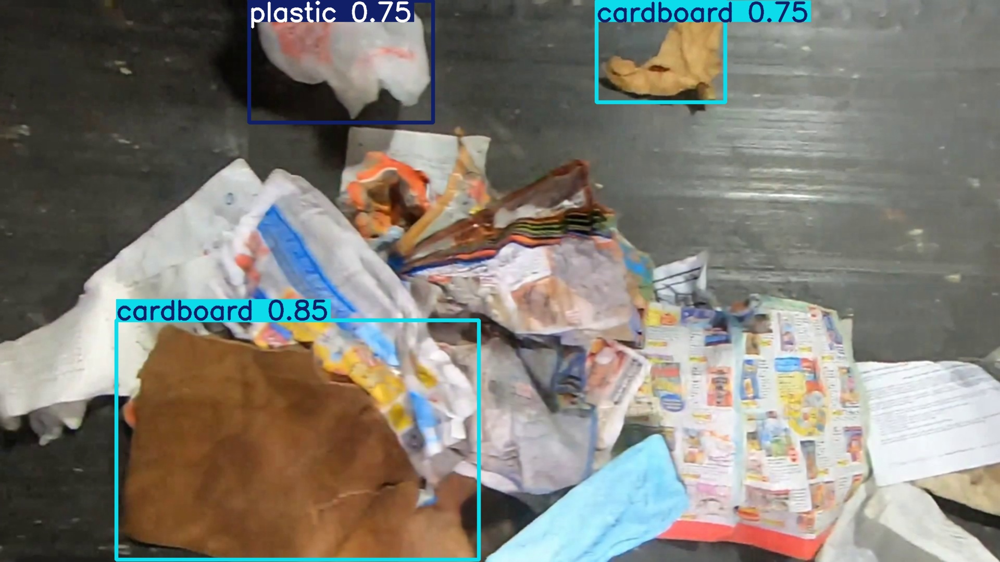

--------------------------------------------------------------------------------

Imagem: 03_frame_038000.jpg


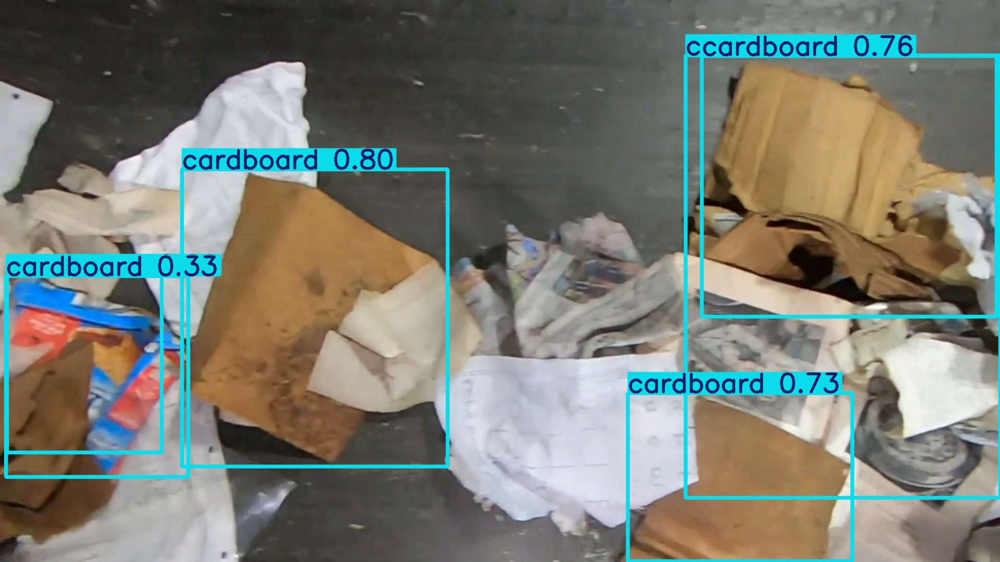

--------------------------------------------------------------------------------

Imagem: 08_frame_010600.jpg


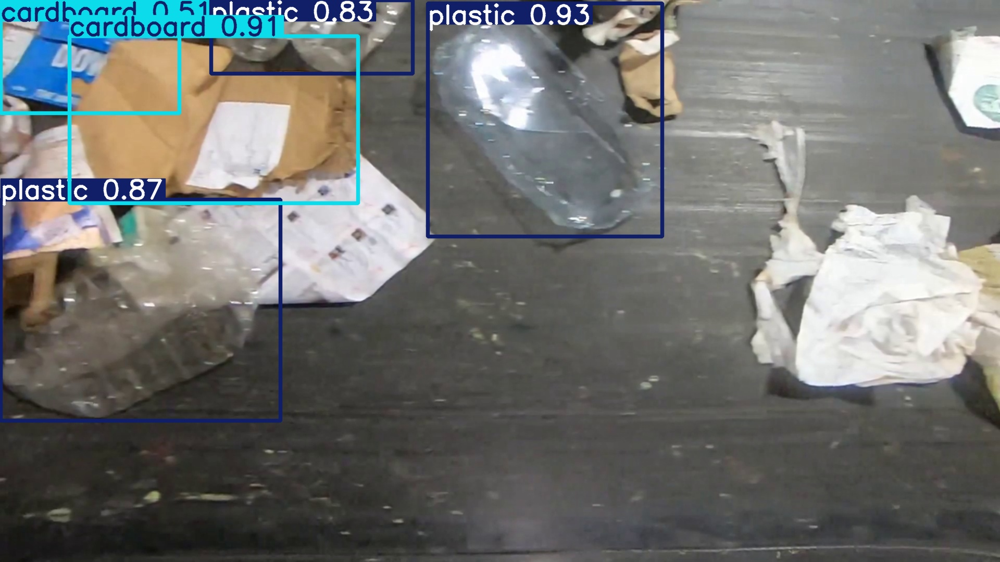

--------------------------------------------------------------------------------

Imagem: 05_frame_000951.jpg


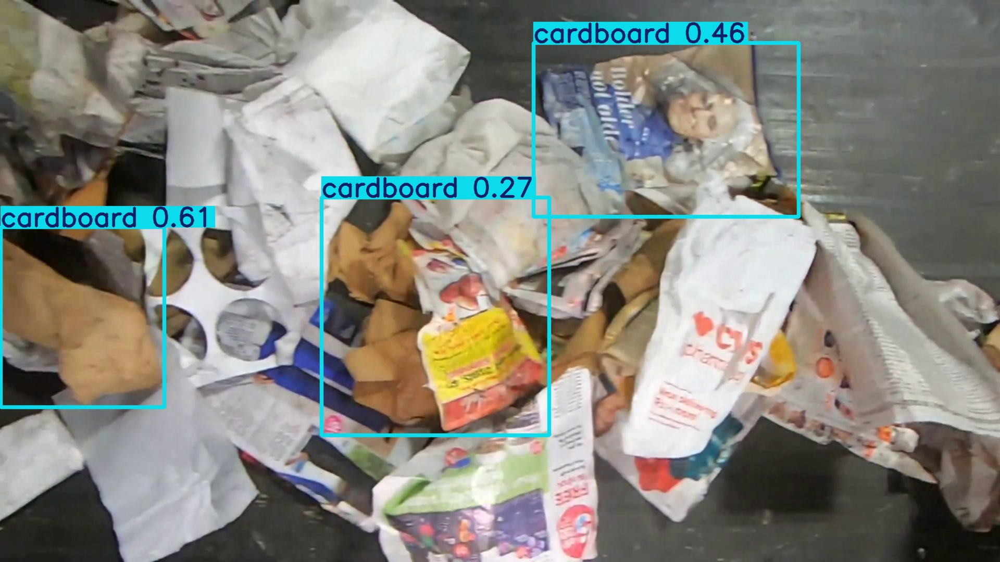

--------------------------------------------------------------------------------

Imagem: 01_frame_028300.jpg


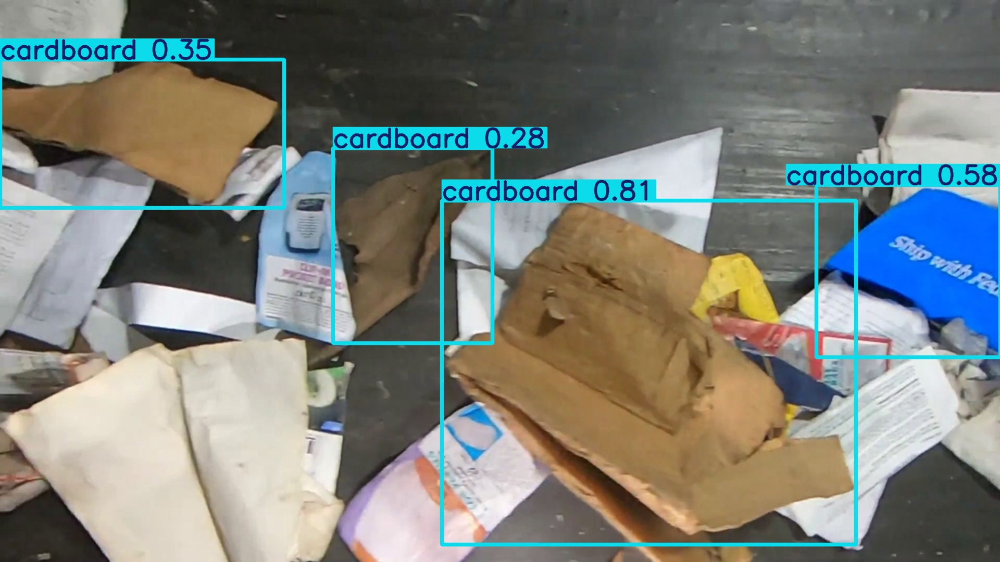

--------------------------------------------------------------------------------

Imagem: 03_frame_035100.jpg


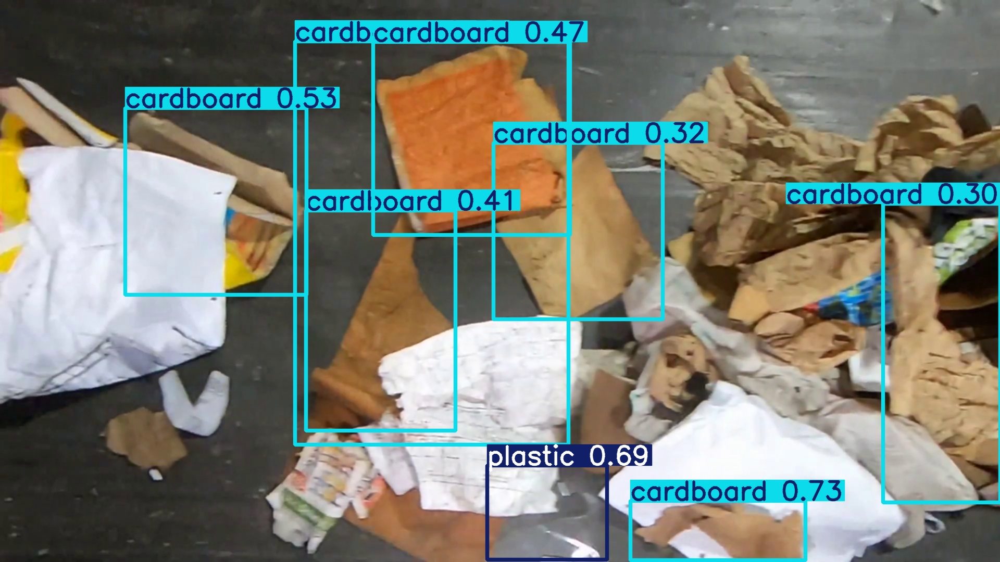

--------------------------------------------------------------------------------

Imagem: 01_frame_044000.jpg


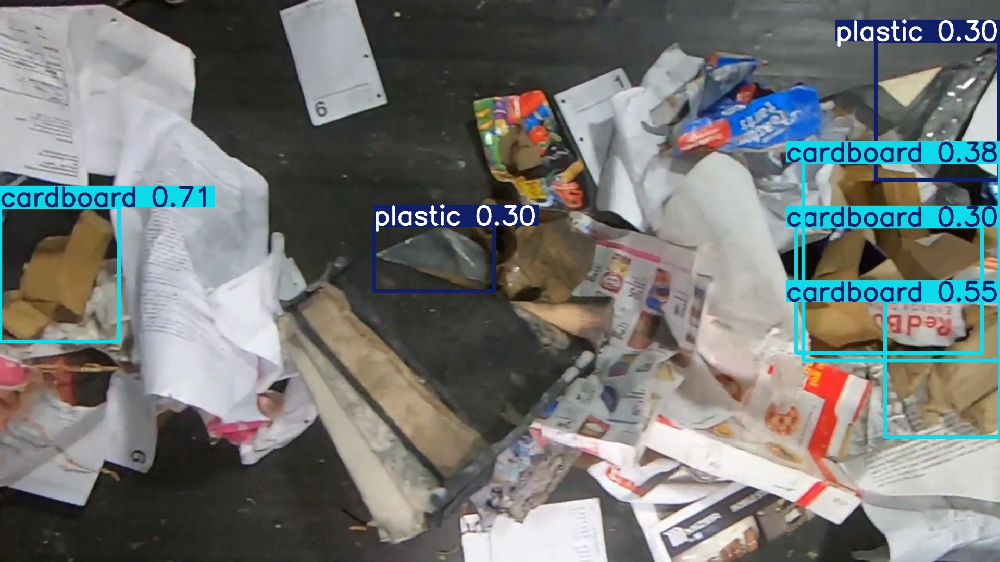

--------------------------------------------------------------------------------

Imagem: 03_frame_037200.jpg


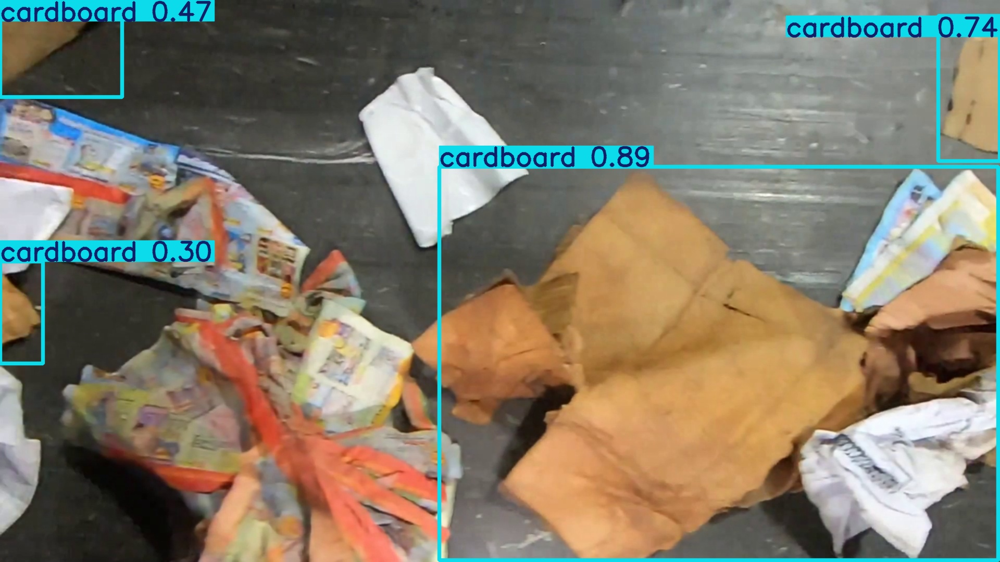

--------------------------------------------------------------------------------

Imagem: 08_frame_000211.jpg


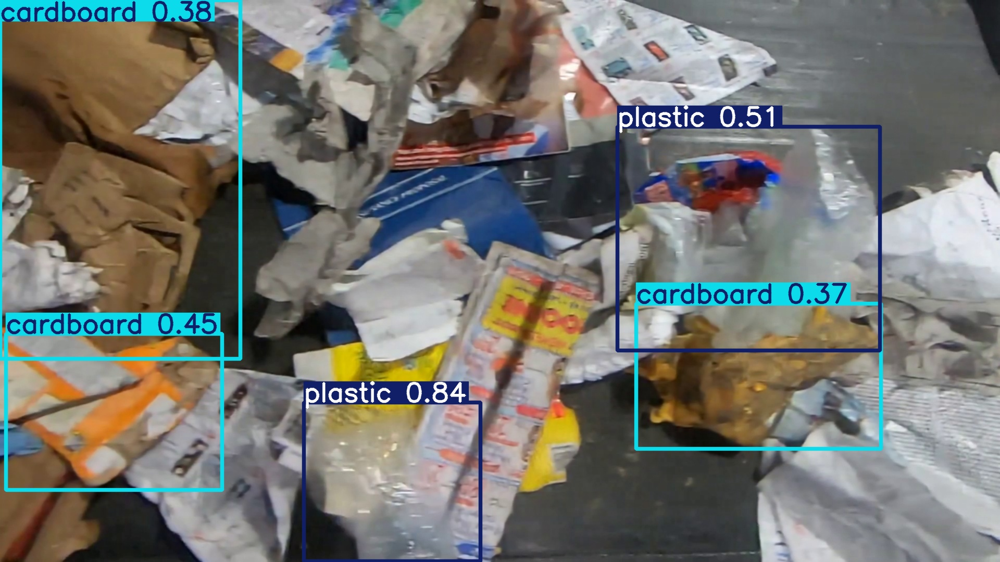

--------------------------------------------------------------------------------

Imagem: 09_frame_003810.jpg


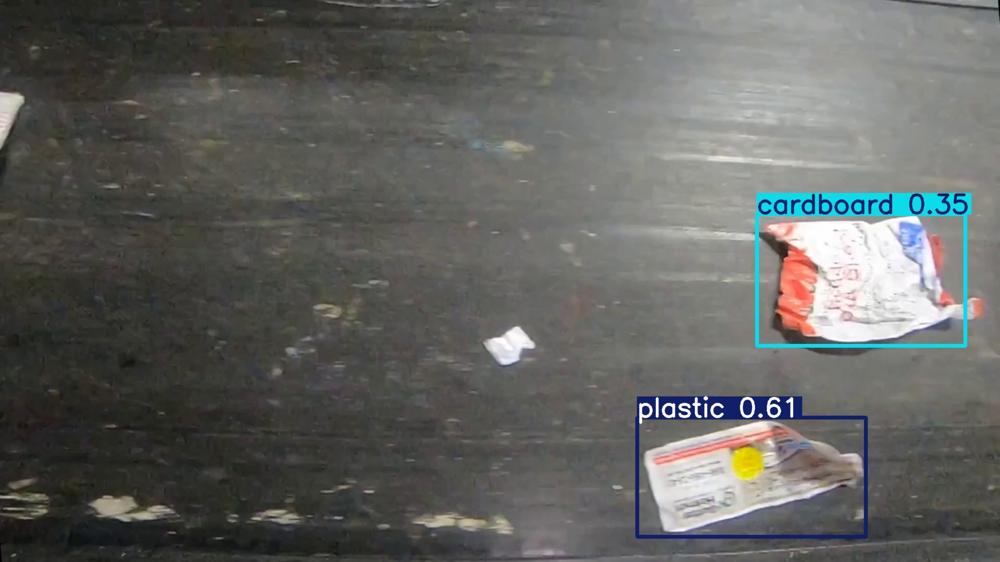

--------------------------------------------------------------------------------

Imagem: 01_frame_043200.jpg


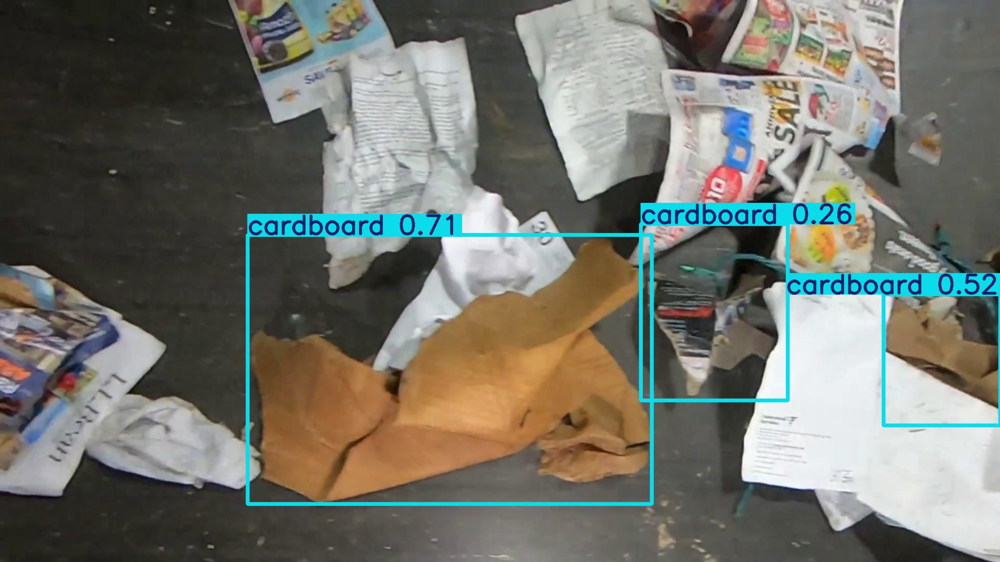

--------------------------------------------------------------------------------

Imagem: 01_frame_025000.jpg


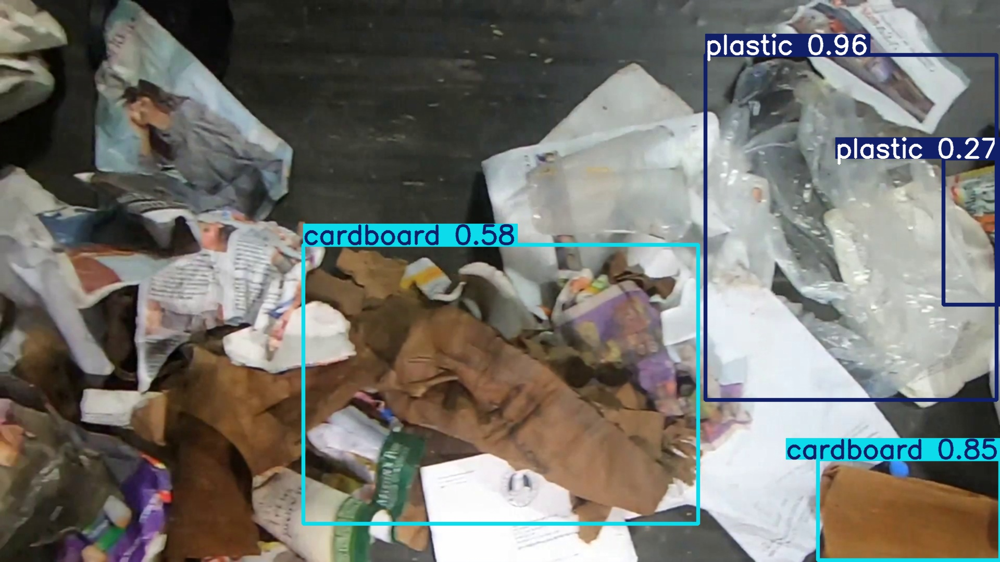

--------------------------------------------------------------------------------

Imagem: 05_frame_000401.jpg


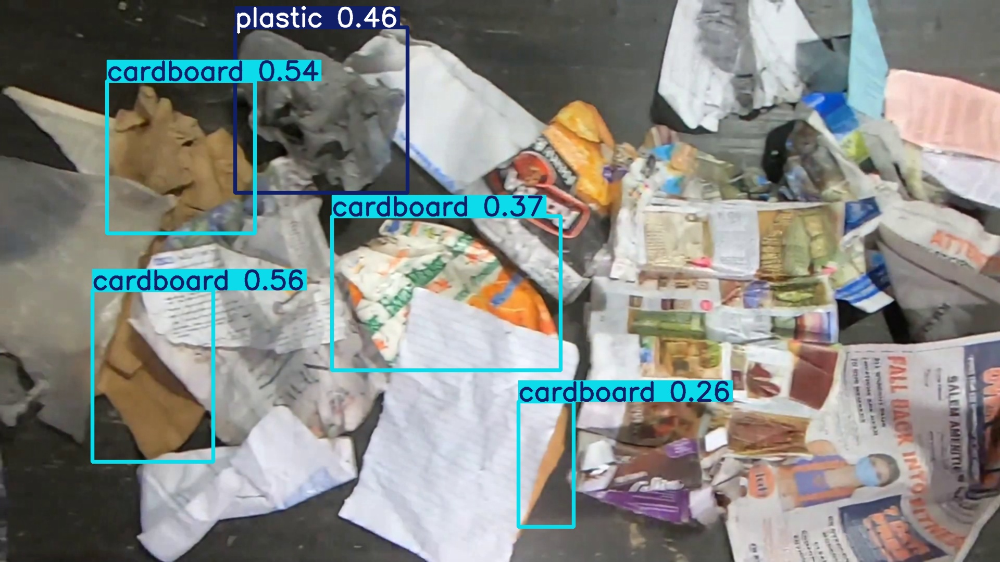

--------------------------------------------------------------------------------

Imagem: 05_frame_000921.jpg


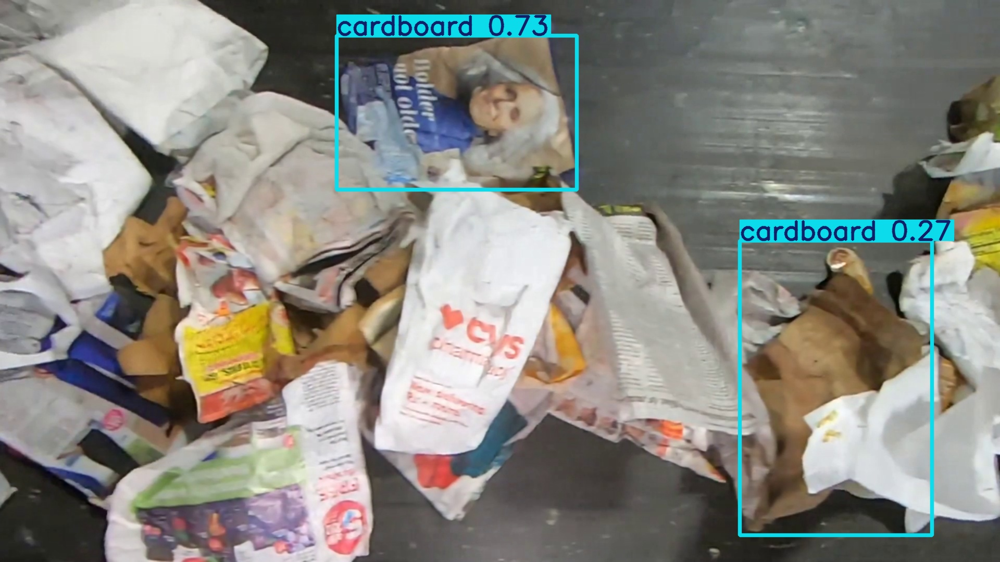

--------------------------------------------------------------------------------

Imagem: 05_frame_000031.jpg


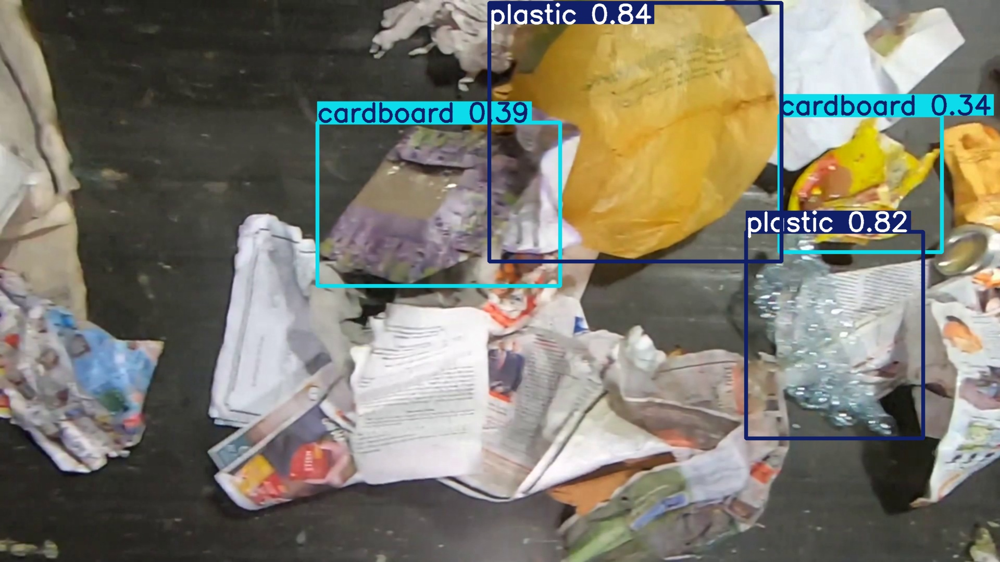

--------------------------------------------------------------------------------

Imagem: 01_frame_038100.jpg


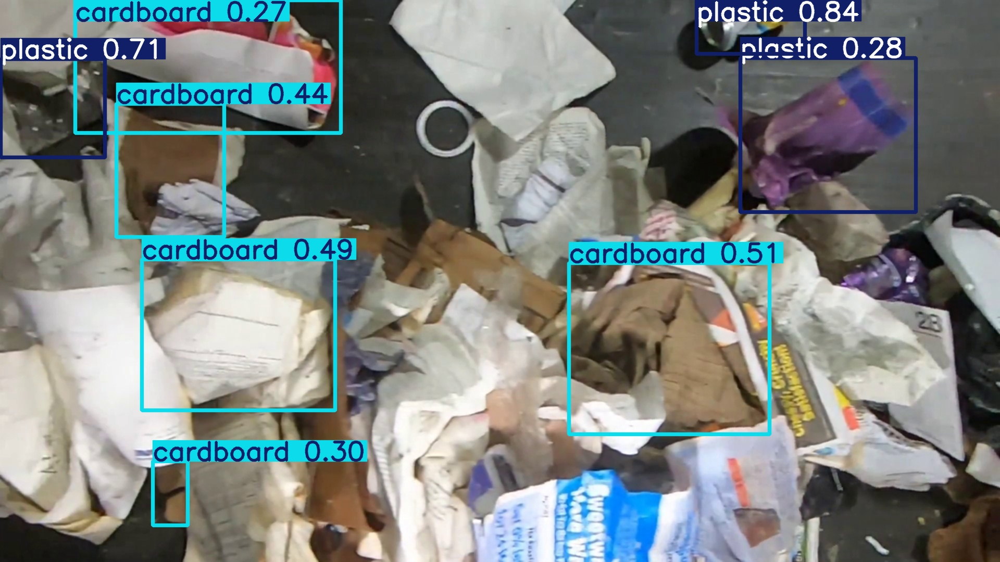

--------------------------------------------------------------------------------

Imagem: 09_frame_003600.jpg


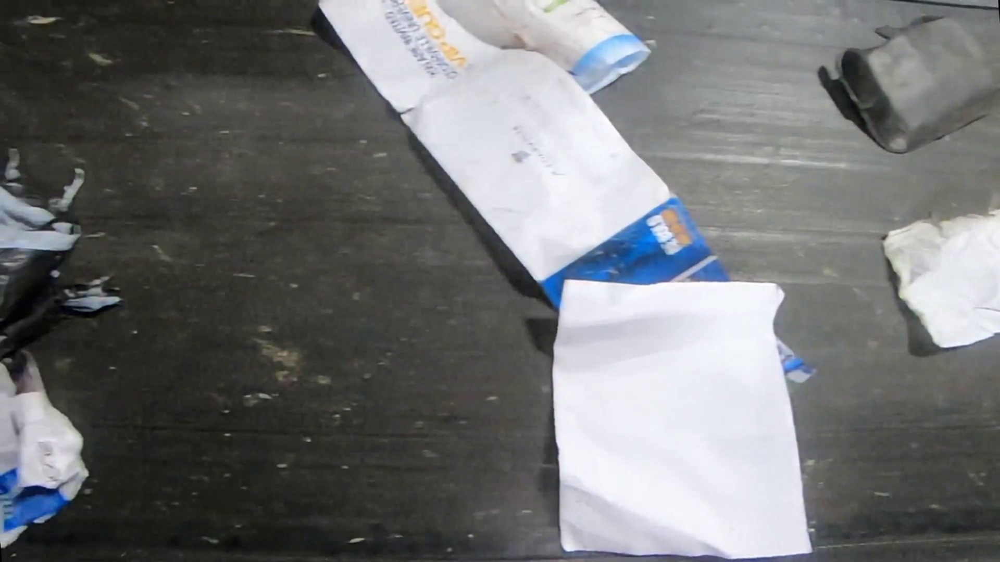

--------------------------------------------------------------------------------

Imagem: 05_frame_000131.jpg


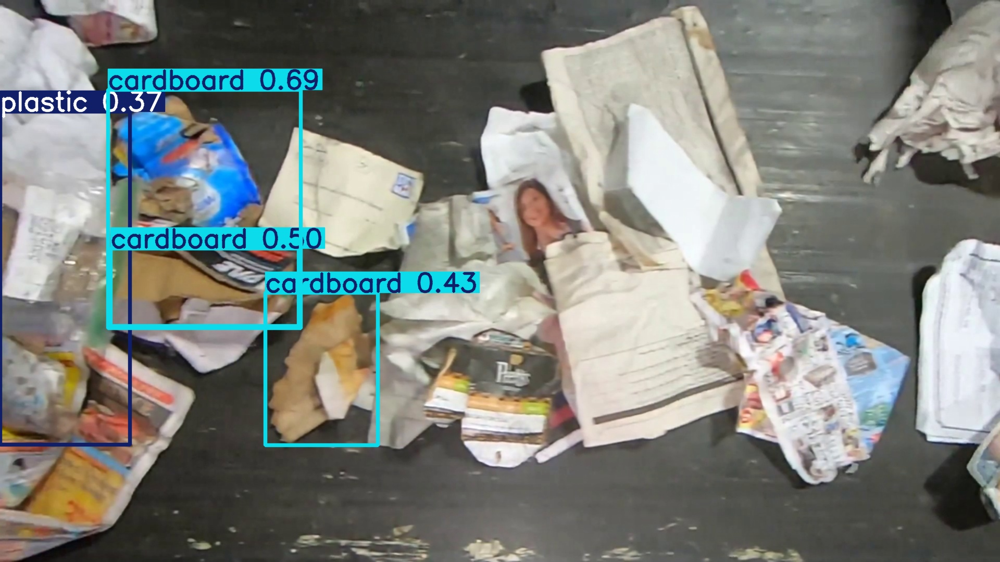

--------------------------------------------------------------------------------

Imagem: 03_frame_046200.jpg


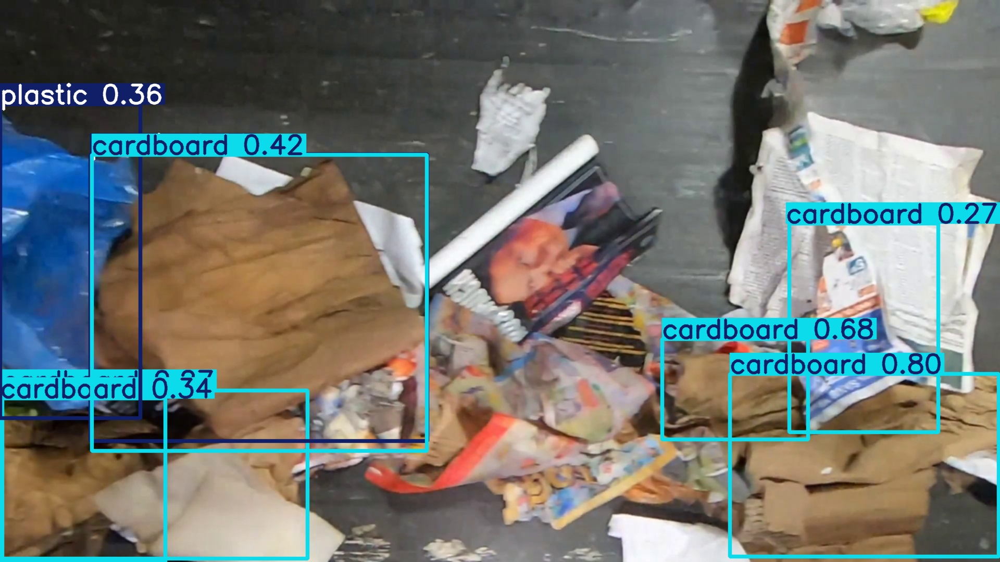

--------------------------------------------------------------------------------

Imagem: 01_frame_041600.jpg


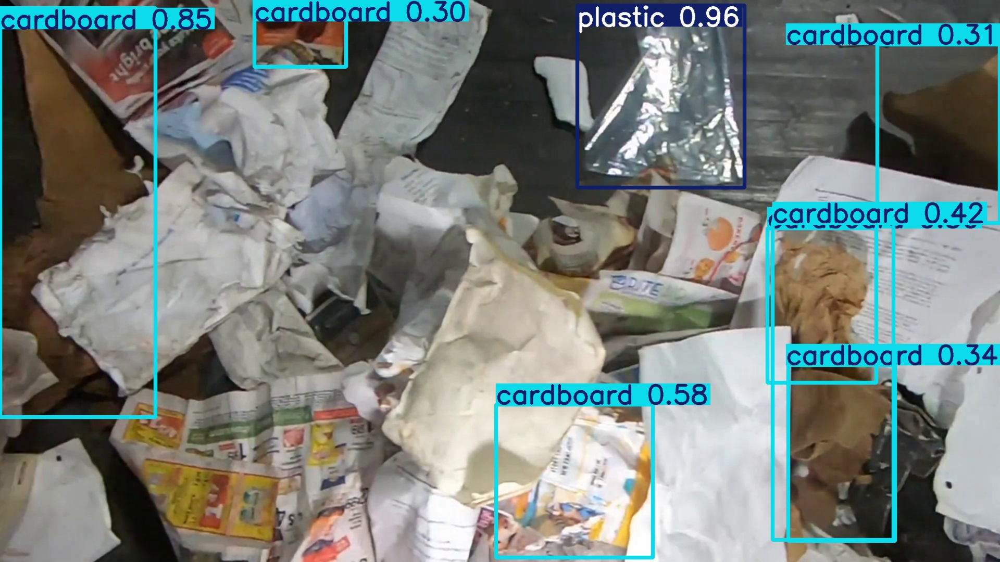

--------------------------------------------------------------------------------

Imagem: 01_frame_036500.jpg


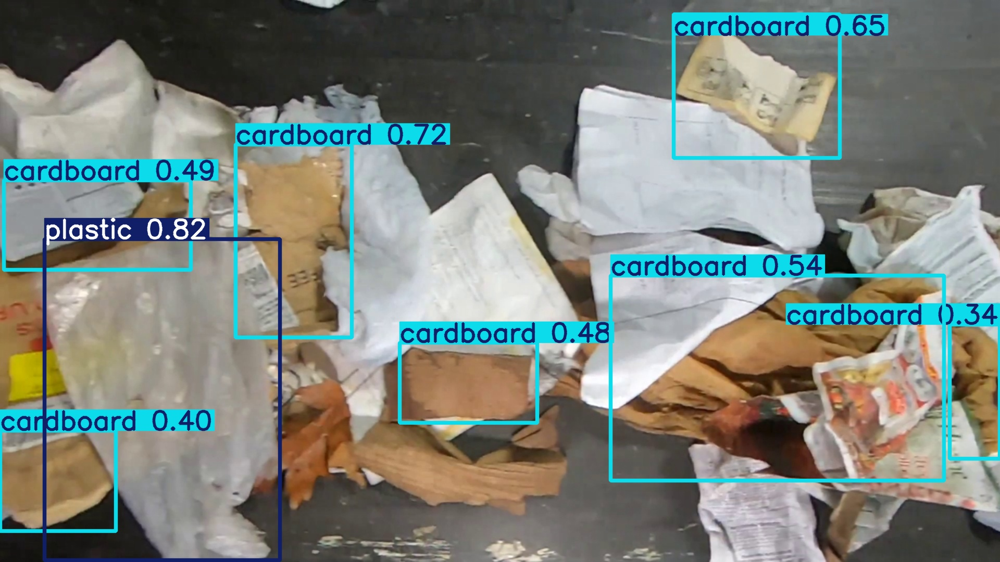

--------------------------------------------------------------------------------

Imagem: 01_frame_046600.jpg


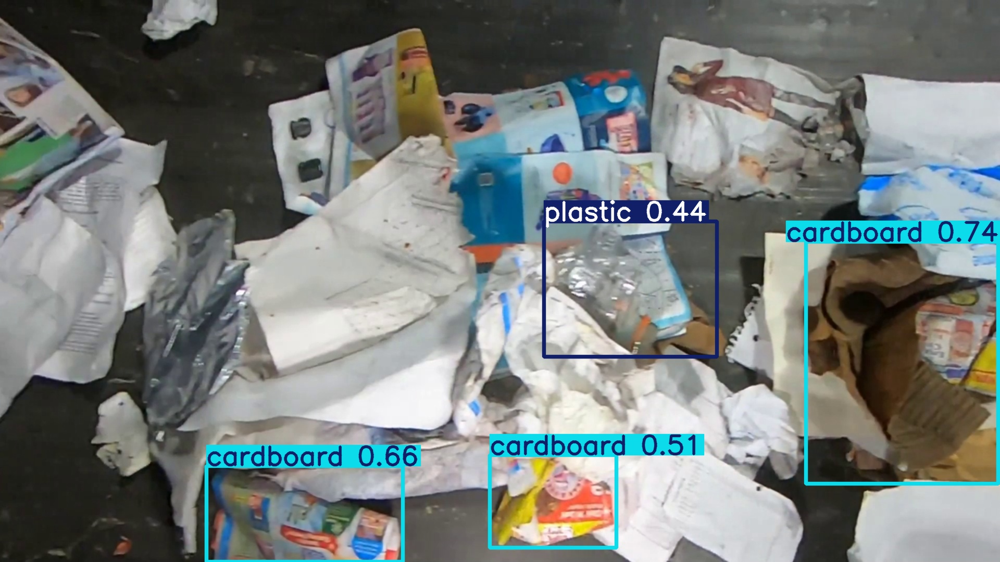

--------------------------------------------------------------------------------

Imagem: 03_frame_032700.jpg


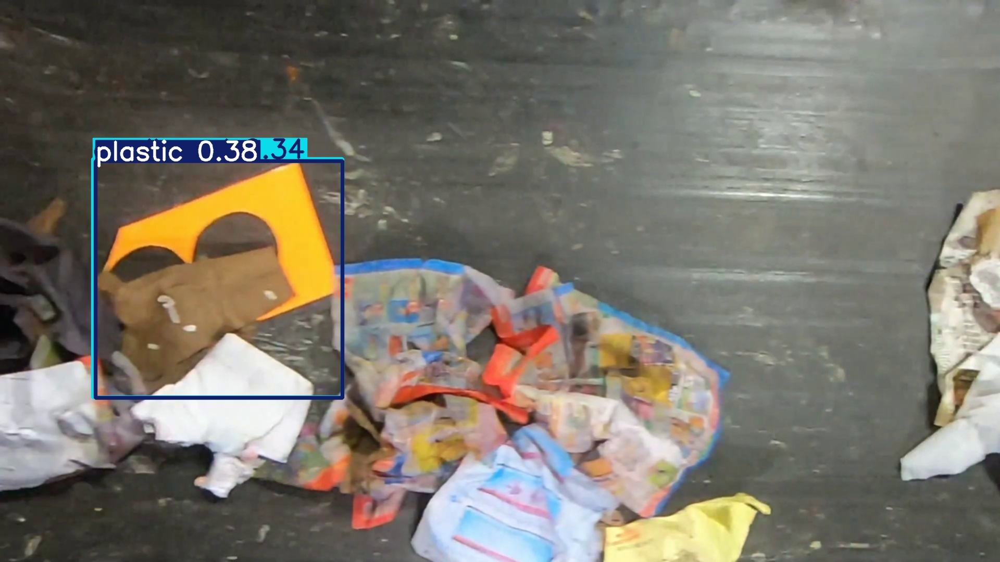

--------------------------------------------------------------------------------

Imagem: 03_frame_025500.jpg


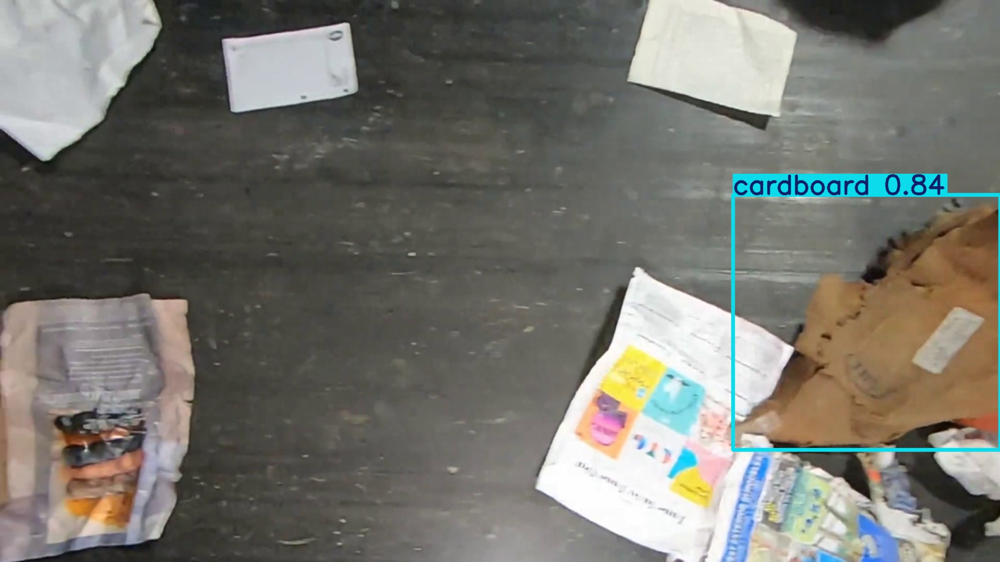

--------------------------------------------------------------------------------

Imagem: 08_frame_005300.jpg


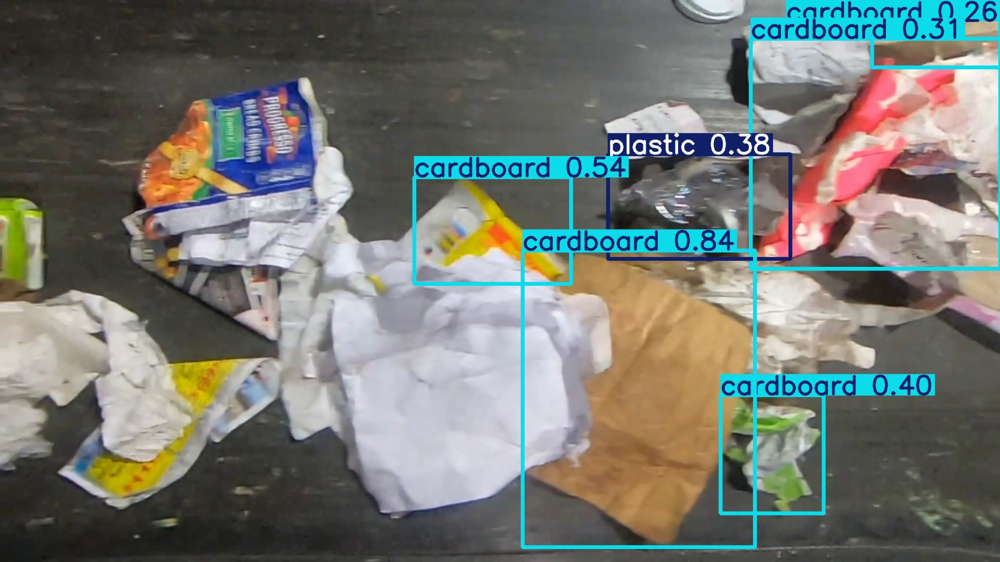

--------------------------------------------------------------------------------



In [10]:
# ==========================================
# 2. AMOSTRAGEM VISUAL DE PREDIÇÕES
# ==========================================
# Busca por todas as imagens processadas no diretório de saída
imagens_processadas = glob.glob(os.path.join(diretorio_saida, "*.jpg")) + \
                      glob.glob(os.path.join(diretorio_saida, "*.png")) + \
                      glob.glob(os.path.join(diretorio_saida, "*.jpeg")) 

total_imagens = len(imagens_processadas)
print(f"Total de imagens encontradas: {total_imagens}\n")

limite_exibicao = 25

if total_imagens > 0:
    quantidade_para_exibir = min(limite_exibicao, total_imagens)
    
    # Pega uma amostragem aleatória única
    imagens_aleatorias = random.sample(imagens_processadas, quantidade_para_exibir)

    print(f"🎲 Exibindo {quantidade_para_exibir} imagens sorteadas:\n")
    for i, caminho_img in enumerate(imagens_aleatorias):
        # Nome do arquivo para referência
        print(f"Imagem: {os.path.basename(caminho_img)}")
        display(Image(filename=caminho_img, width=600)) 
        print("-" * 80 + "\n")
else:
    print("❌ Nenhuma imagem encontrada no diretório.")

📊 Foram encontradas 8 imagens de métricas e distribuições.

📈 Gráfico: Boxf1 Curve


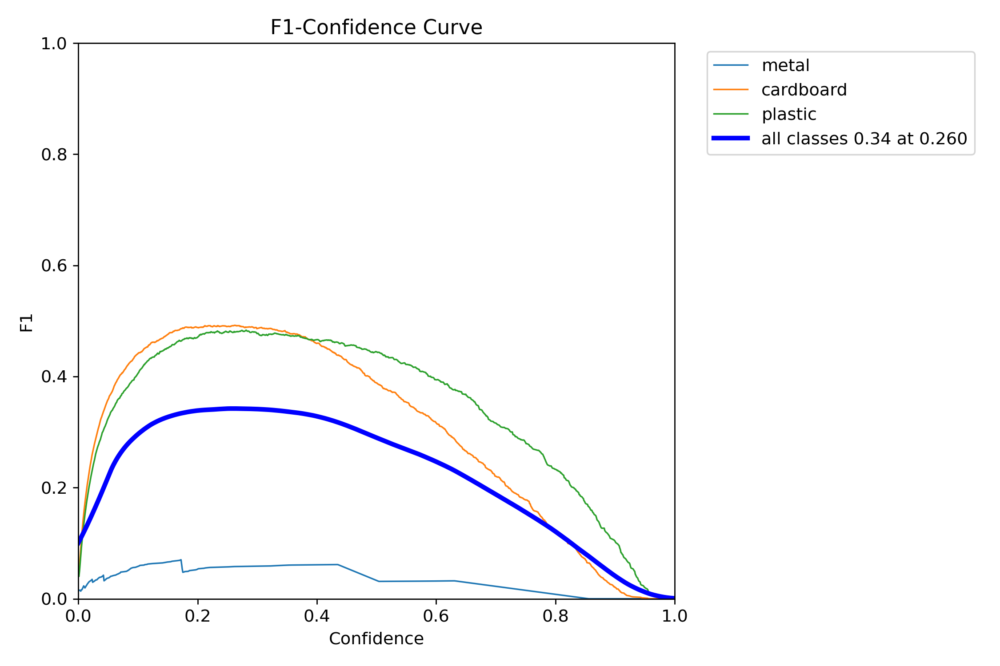

--------------------------------------------------------------------------------

📈 Gráfico: Boxpr Curve


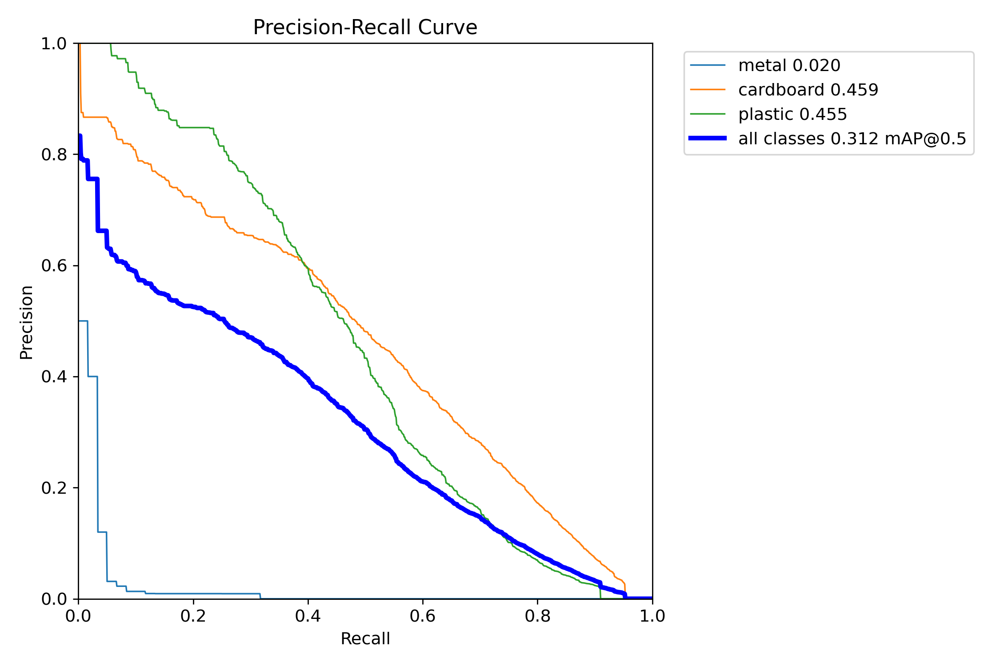

--------------------------------------------------------------------------------

📈 Gráfico: Boxp Curve


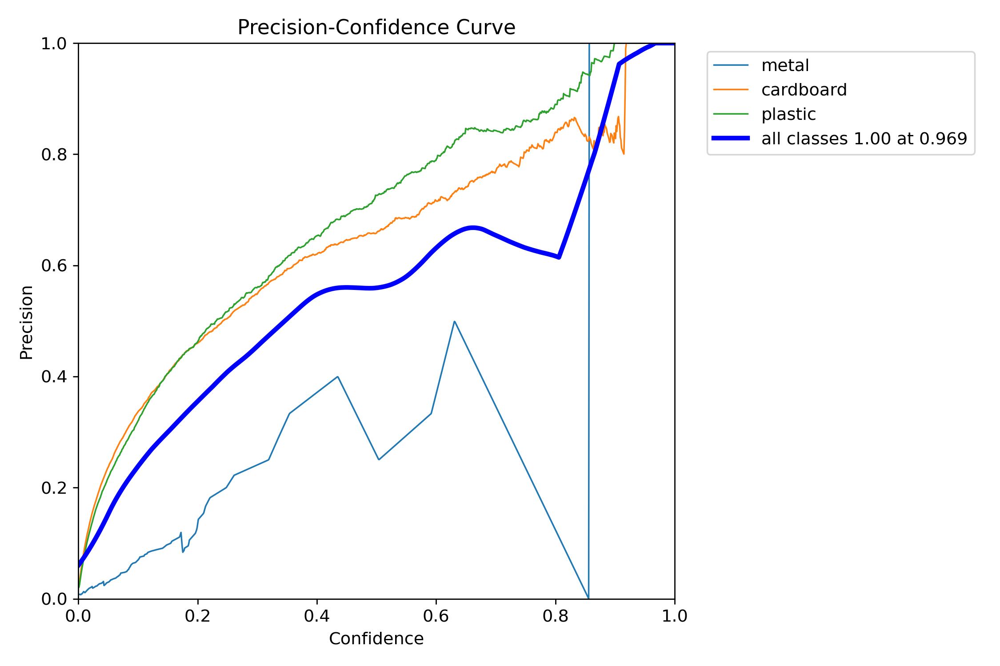

--------------------------------------------------------------------------------

📈 Gráfico: Boxr Curve


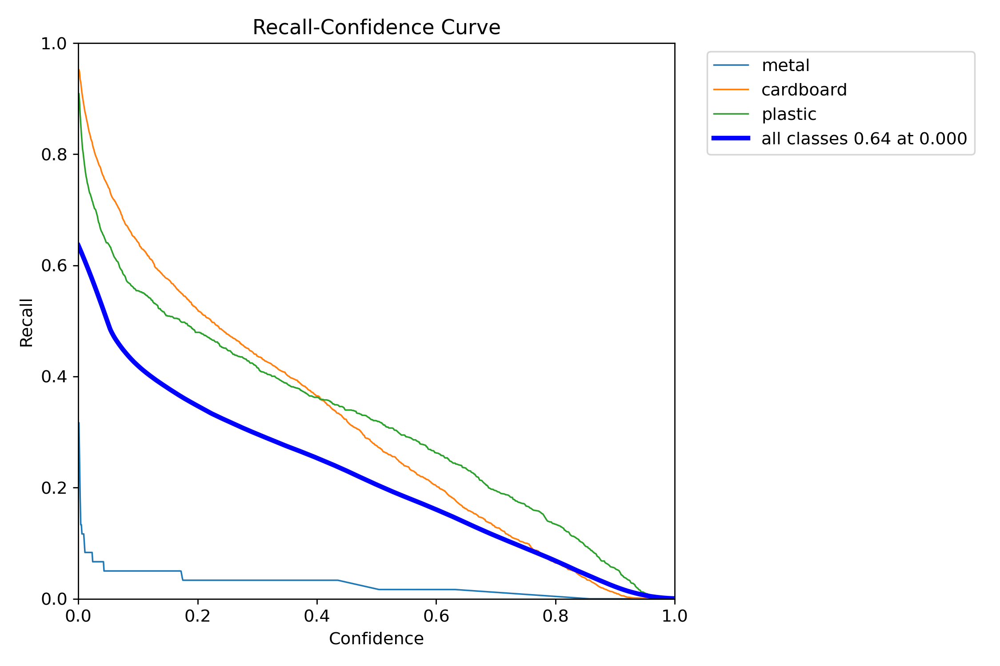

--------------------------------------------------------------------------------

📈 Gráfico: Confusion Matrix


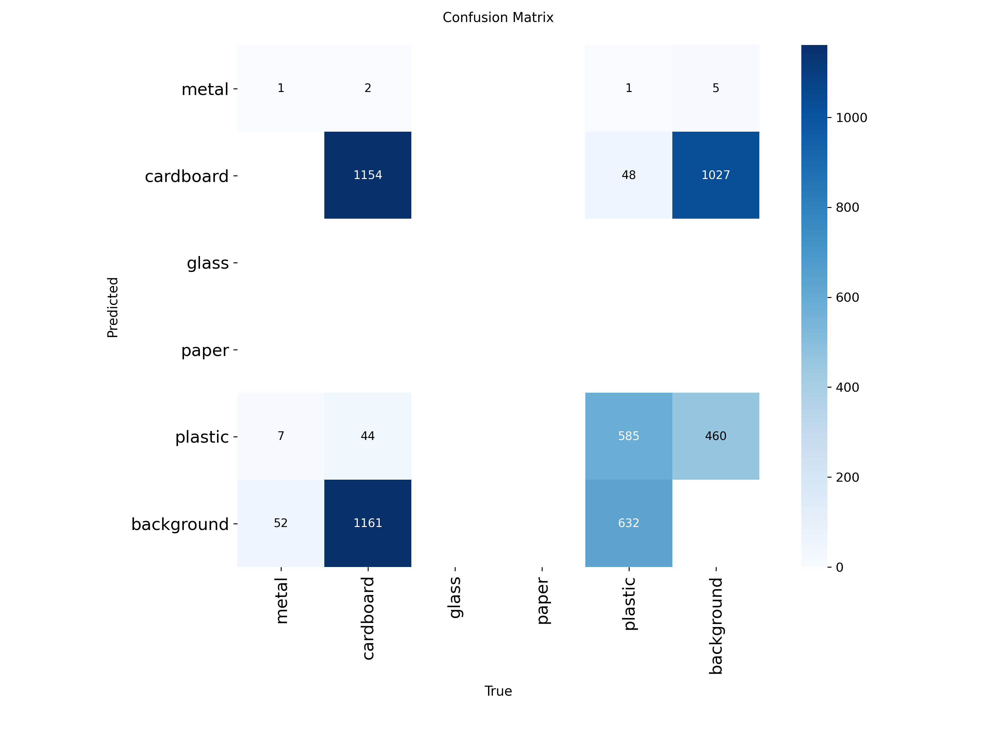

--------------------------------------------------------------------------------

📈 Gráfico: Confusion Matrix Normalized


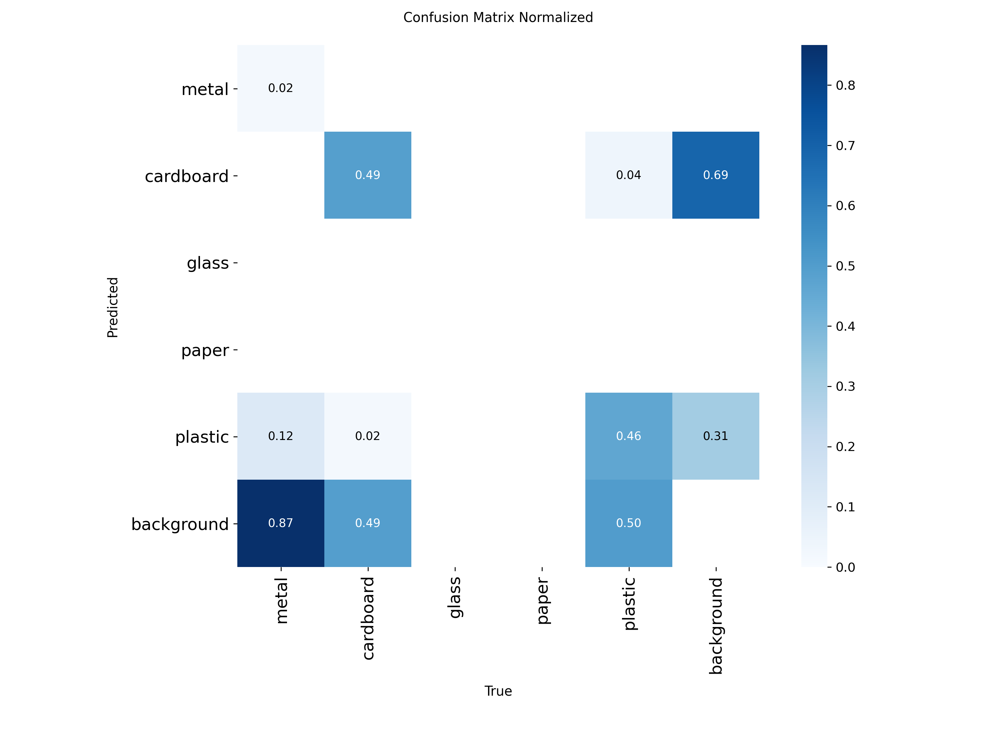

--------------------------------------------------------------------------------

📈 Gráfico: Labels


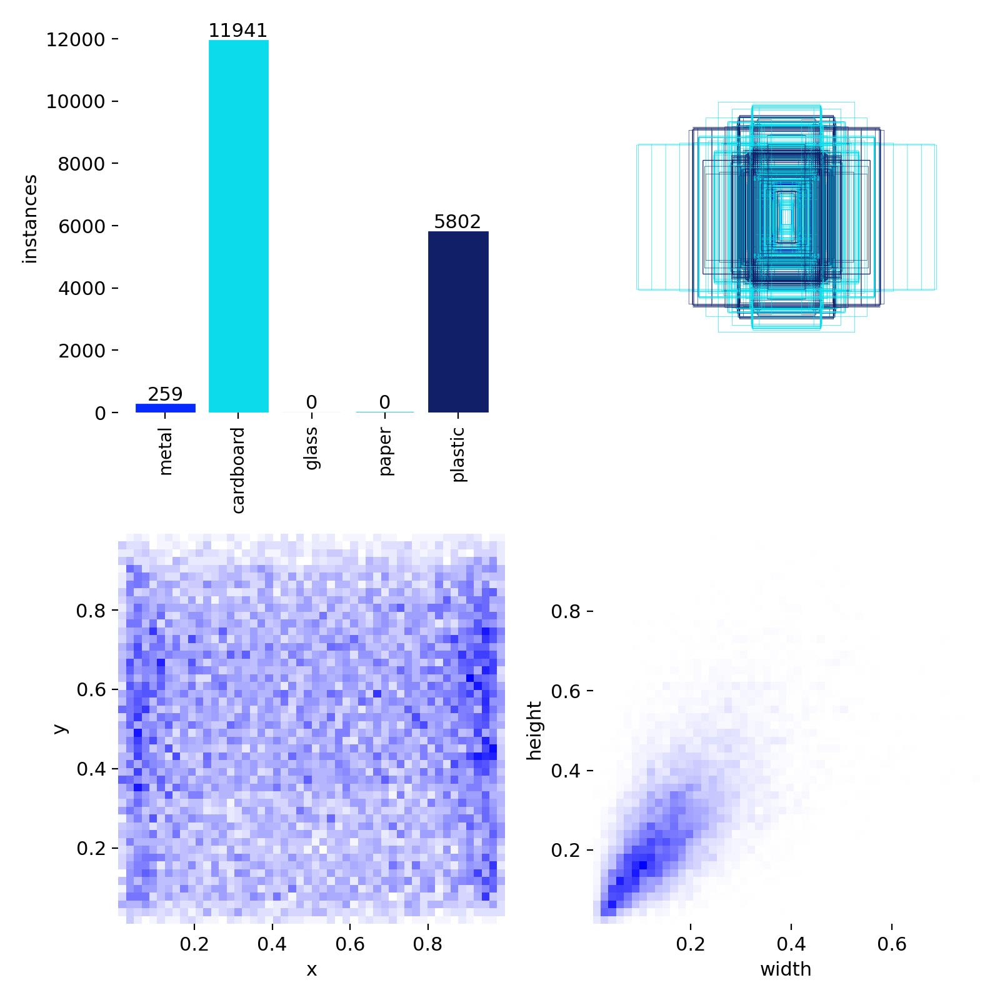

--------------------------------------------------------------------------------

📈 Gráfico: Results


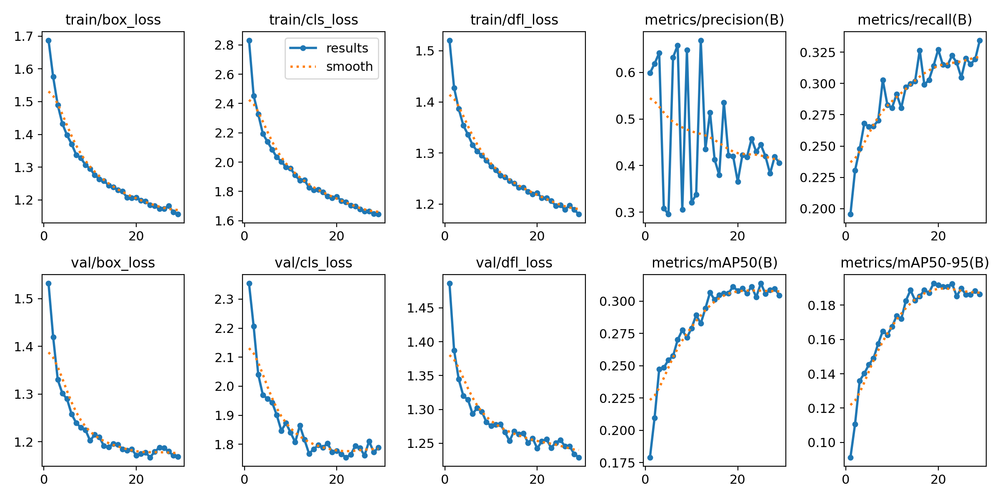

--------------------------------------------------------------------------------



In [11]:
# ==========================================
# 3. PLOTAGEM DE MÉTRICAS DO TREINO
# ==========================================
# A pasta original onde o treinamento ocorreu
pasta_treino = "runs/detect/finetunning_esteira/yolov10s_lixo_finetune_esteira"

todas_imagens_treino = glob.glob(os.path.join(pasta_treino, "*.png")) + \
                       glob.glob(os.path.join(pasta_treino, "*.jpg"))

# Lógica de filtragem: ignora imagens que mostram exemplos de batches
imagens_metricas = [
    caminho for caminho in todas_imagens_treino 
    if "val_batch" not in os.path.basename(caminho) and "train_batch" not in os.path.basename(caminho)
]

print(f"📊 Foram encontradas {len(imagens_metricas)} imagens de métricas e distribuições.\n")
print("=" * 80)

# Ordena alfabeticamente
for caminho_img in sorted(imagens_metricas):
    nome_arquivo = os.path.basename(caminho_img)
    titulo_formatado = nome_arquivo.replace('.png', '').replace('.jpg', '').replace('_', ' ').title()
    
    print(f"📈 Gráfico: {titulo_formatado}")
    display(Image(filename=caminho_img, width=1000))
    print("-" * 80 + "\n")